In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import kaepora as kpora
import flux_calibration as fc
import composite
import numpy as np
import pysynphot
from astropy import units as u
from scipy.interpolate import interp2d
import glob
from mpl_toolkits.mplot3d import Axes3D
import gp2d_george as gp2d
import prep 

In [3]:
query_strings = ["SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase < -10. and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))"]
max_phase = 16.
p1 = -10.
bin_size = 3.
step = 2
p2 = p1+bin_size
while p1 < max_phase:
    query_strings.append("SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= %f and phase < %f and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))"% (p1,p2))
    p1 += step
    p2 += step

max_phase_2 = 43
bin_size = 8.
step = 4
p2 = p1+bin_size
while p1 < max_phase_2:
    query_strings.append("SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= %f and phase < %f and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))"% (p1,p2))
    p1 += step
    p2 += step
    
print (query_strings)

['SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase < -10. and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))', 'SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= -10.000000 and phase < -7.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))', 'SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= -8.000000 and phase < -5.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))', 'SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= -6.000000 and phase < -3.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))', 'SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= -4.000000 and phase < -1.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm

In [4]:
composites, sn_arrays, boot_sn_arrays = kpora.make_composite(query_strings, boot=False, medmean=1, gini_balance=True, verbose=False)


SQL Query: SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase < -10. and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))
1 Total Spectra found
0 flagged spectra removed 1 spectra left
0 spectra of peculiar Ias removed 1 spectra left
1 spectra of SNe that have host reddening corrections
Arrays cleaned
0 spectra may have telluric contamination
1 total SNe
removed spectra of SNe with A_V > 2.0
Using 1 spectra of 1 SNe
Gini balancing...
Balanced after 1 iterations
SQL Query: SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= -10.000000 and phase < -7.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))
12 Total Spectra found
0 flagged spectra removed 12 spectra left
4 spectra of peculiar Ias removed 8 spectra left
8 spectra of SNe that have host reddening corrections
Arrays cleaned
0 spectra may have telluric contamination
6 total SNe


12 total SNe
removed spectra of SNe with A_V > 2.0
Using 20 spectra of 12 SNe
Gini balancing...
Balanced after 2 iterations
SQL Query: SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= 14.000000 and phase < 17.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))
21 Total Spectra found
1 flagged spectra removed 20 spectra left
2 spectra of peculiar Ias removed 18 spectra left
17 spectra of SNe that have host reddening corrections
Arrays cleaned
0 spectra may have telluric contamination
10 total SNe
removed spectra of SNe with A_V > 2.0
Using 17 spectra of 10 SNe
Gini balancing...
Balanced after 4 iterations
SQL Query: SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN and phase >= 16.000000 and phase < 24.000000 and ((dm15_source >= 1.4 and dm15_source < 1.6) or (dm15_from_fits >= 1.4 and dm15_from_fits < 1.6))
36 Total Spectra found
3 flagged spectra removed 33 spectra left
4 spectra of p

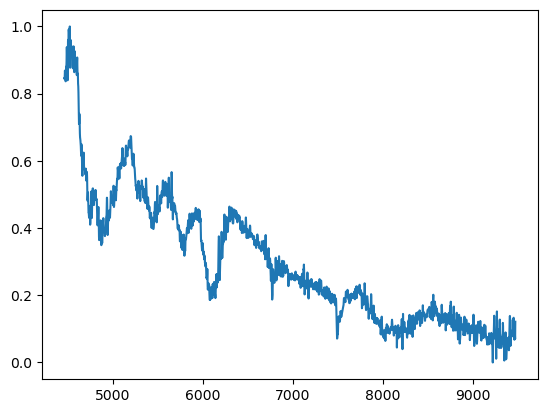

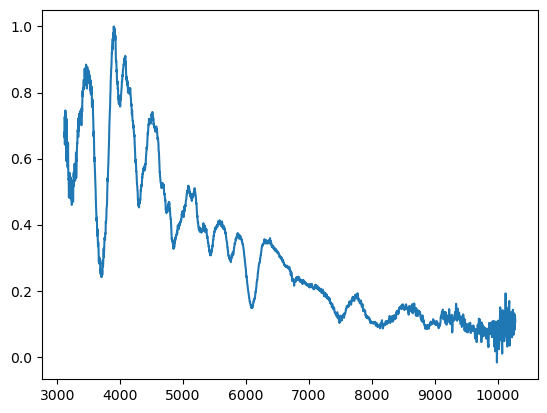

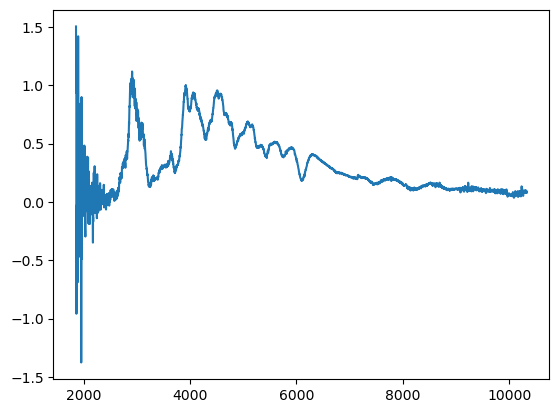

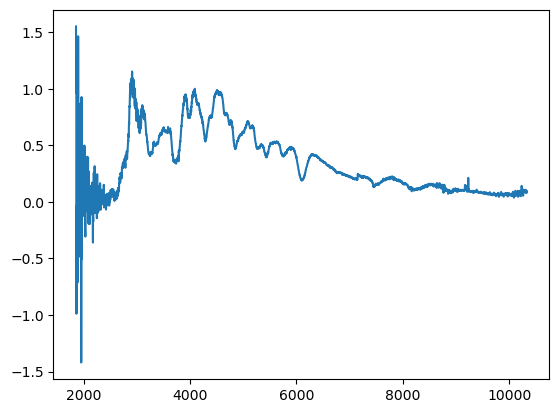

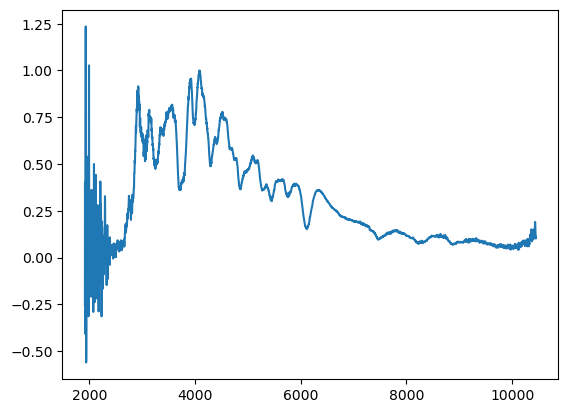

...

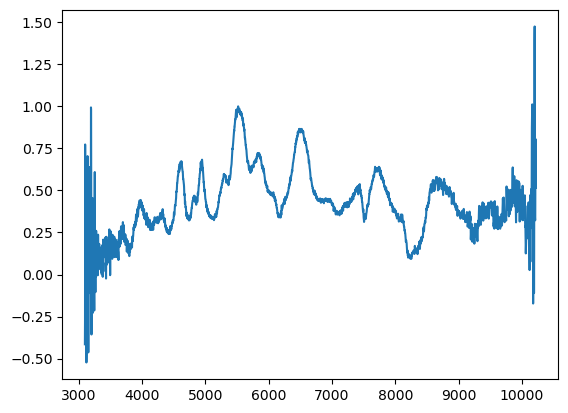

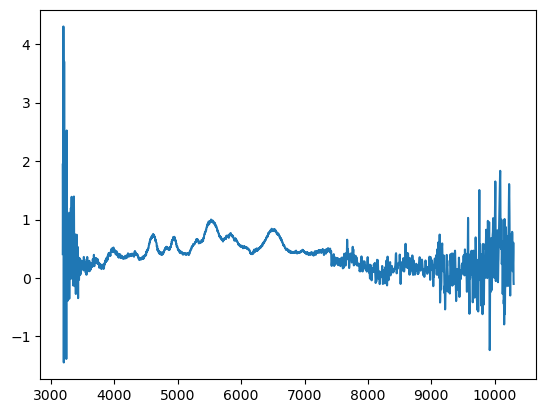

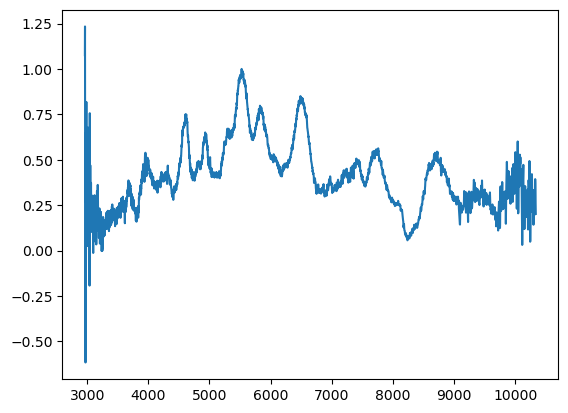

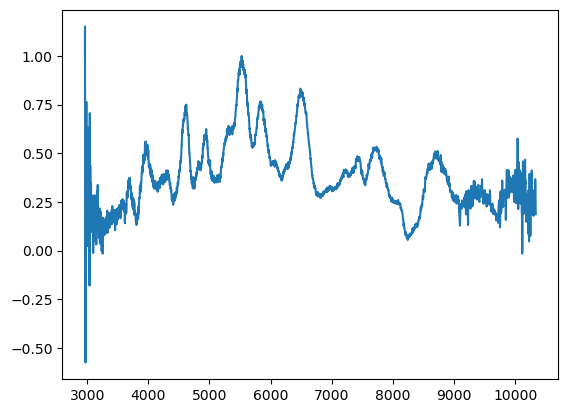

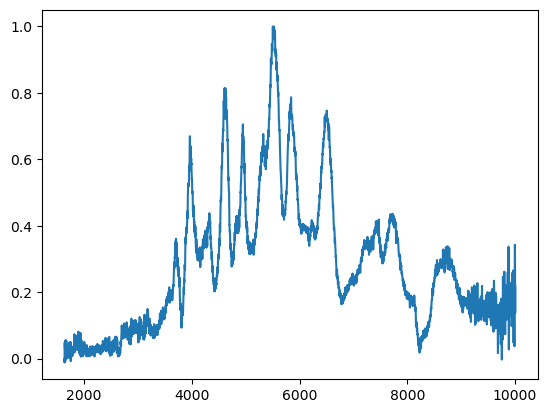

In [5]:
comp_dict = {}
for comp in composites:
    comp.phase = np.nanmean(comp.phase_array)
    comp.mjd = np.nanmean(comp.phase_array)
    comp_dict[comp.phase] = comp
    plt.plot(comp.wavelength,comp.flux)
    plt.show()

In [6]:
# kpora.set_min_num_spec(composites,5)

In [7]:
def calc_x1_from_dm15(dm15):
    a = 0.01828958
    b = -0.13430543
    c = 1.02585001 - dm15
    sol = (-b-np.sqrt(b**2.-4.*a*c))/(2*a)
    return sol

print (calc_x1_from_dm15(1.5))

-2.605743867455968


In [8]:
phase_s, wavelength_salt, flux_salt = np.loadtxt('../data/info_files/SALT/salt2-4/salt2_template_0.dat', unpack = True)
phase_s_corr, wavelength_salt_corr, salt_corr = np.loadtxt('../data/info_files/SALT/salt2-4/salt2_template_1.dat', unpack = True)
# flux_salt_m2 = flux_salt - 3.06*salt_corr #dm15=1.61
# flux_salt = flux_salt - 0*salt_corr #dm15=1.1
flux_salt = flux_salt - 2.61*salt_corr #dm15=1.5

salt_temps = {}
phase_list = []
first = True
for i, phase in enumerate(phase_s):
    if phase not in phase_list:
        phase_list.append(phase)
        if not first:
            salt_temps[float(phase_s[i-1])] = [temp_wave, temp_flux]
        temp_wave = [wavelength_salt[i]]
        temp_flux = [flux_salt[i]]
    else:
        temp_wave.append(wavelength_salt[i])
        temp_flux.append(flux_salt[i])
    first = False
    
i=-19.
phases_s = []

band_dict = {
    b'B':pysynphot.ObsBandpass('johnson,b'),
    b'V':pysynphot.ObsBandpass('johnson,v'),
    b'R':pysynphot.ObsBandpass('johnson,r')
}

salt_lcs = {}
while i <= np.amax(list(salt_temps.keys())):
    sp = pysynphot.ArraySpectrum(np.asarray(salt_temps[i][0]), np.asarray(np.asarray(salt_temps[i][1])), fluxunits='flam')
    for band in band_dict.keys():
        bp = band_dict[band]
        spec_obs = pysynphot.Observation(sp, bp, force='extrap')
        mag_from_spec = spec_obs.effstim('vegamag')
        if salt_lcs.get(band, None) is not None:
            salt_lcs[band].append(mag_from_spec)
        else:
            salt_lcs[band] = [mag_from_spec]

    phases_s.append(i)
    i+=1

phot = {}
err_h = 0.01*np.ones(len(phases_s))
for band in band_dict.keys():
    phot[band] = [phases_s,salt_lcs[band],err_h,'salt']

Warning, 573 of 721 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 573 of 721 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

Warning, 139 of 721 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 148 of 721 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

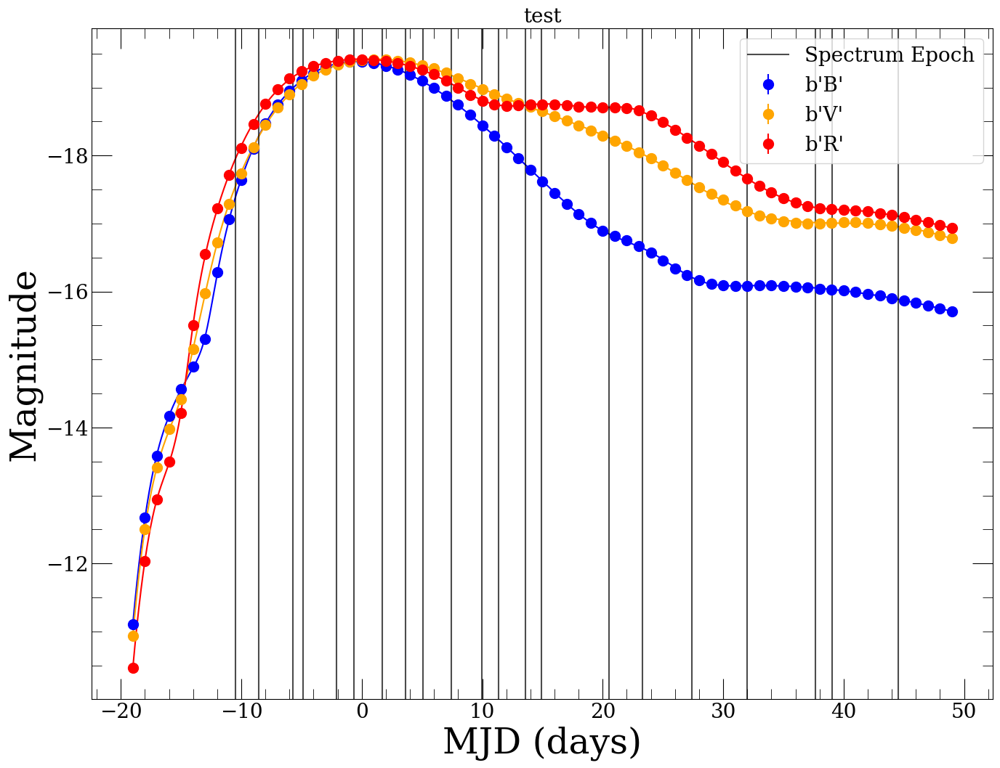

In [9]:
for comp in composites:
    comp.event_data = {}
    comp.event_data['Homogenized_Photometry'] = phot
    
fc.plot_light_curves(phot, 'test', spec_dates = comp_dict.keys(), fit=True)

In [10]:
#code for hsiao
# t_h, U_h, B_h, V_h, R_h, I_h, Y_h, J_h, H_h, K_h = np.loadtxt('../data/info_files/hsiao_lc_template.dat', unpack = True)
# err_h = 0.01*np.ones(len(t_h))
# phot = {}
# phot[b'B'] = [t_h[5:],B_h[5:],err_h[5:],'hsiao']
# phot[b'V'] = [t_h[5:],V_h[5:],err_h[5:],'hsiao']
# phot[b'R'] = [t_h[5:],R_h[5:],err_h[5:],'hsiao']
# phot[b'I'] = [t_h[5:],I_h[5:],err_h[5:],'hsiao']

# for comp in composites.values():
#     comp.event_data = {}
#     comp.event_data['Homogenized_Photometry'] = phot
    
# fc.plot_light_curves(phot, 'test', spec_dates = composites.keys(), fit=True)

In [11]:
#MW correction?

In [12]:
spec_array = composite.prelim_norm(composites)
for spec in spec_array:
    vbs = fc.valid_bands(spec)
    scale, mags_from_phot = fc.scale_flux_to_photometry_pysyn(spec, vbs)
    if ~np.isnan(scale):
        spec.scale_to_phot = scale
    else:
        spec.scale_to_phot = None

Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used in

Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2503 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used in

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3583 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3583 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defin

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3583 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3583 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defin

Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used inst

Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 123 of 4239 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a d

Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 88 of 4268 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

Warning, 79 of 4088 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 79 of 4088 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 79 of 4088 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used inste

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 79 of 4088 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 79 of 4088 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

Warning, 8 of 4253 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 8 of 4253 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 8 of 4253 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 8 of 4253 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4330 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 96 of 4269 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 96 of 4269 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 96 of 4269 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 96 of 4269 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 81 of 3522 bins contained negative fluxes; they have been set

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 82 of 4237 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 82 of 4237 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 82 of 4237 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 82 of 4237 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 7 of 3635 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 7 of 3635 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defin

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 7 of 3635 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 7 of 3635 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defin

Warning, 93 of 4126 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 93 of 4126 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 93 of 4126 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 93 of 4126 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a def

Warning, 119 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 119 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 119 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 119 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a d

Warning, 118 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 118 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 118 of 4229 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used inst

Warning, 37 of 3561 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 37 of 3561 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 37 of 3561 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 37 of 3561 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a def

Warning, 237 of 3559 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 237 of 3559 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a d

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 237 of 3559 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 237 of 3559 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a d

Warning, 9 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 9 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 9 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 9 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

Warning, 13 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 13 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a def

(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 13 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 13 of 3689 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a def

Warning, 6 of 4187 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 6 of 4187 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defin

(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 6 of 4187 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Volumes/cdbs/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 6 of 4187 bins contained negative fluxes; they have been set to zero.
(/Volumes/cdbs/comp/nonhst/johnson_b_004_syn.fits) does not have a defin

In [13]:
for spec in spec_array:
    print (spec.scale_to_phot)
    spec.flux *= spec.scale_to_phot
    spec.ivar /= spec.scale_to_phot**2

0.09215281830298622
0.2113123909632112
0.47973066709402945
0.529758446157838
0.6223235813212307
0.6199871191122066
0.4619323226194053
0.3747273066414206
0.3144603255439481
0.4416600769822851
0.23742579212289142
0.23295902613505137
0.29741789531341994
0.15784863806260277
0.10905780958004235
0.09648214533735425
0.0907784287682662
0.18141941858305094
0.04288095348327382
0.04198760028570581
0.03600900580967377


In [14]:
#apply reddening corrections?

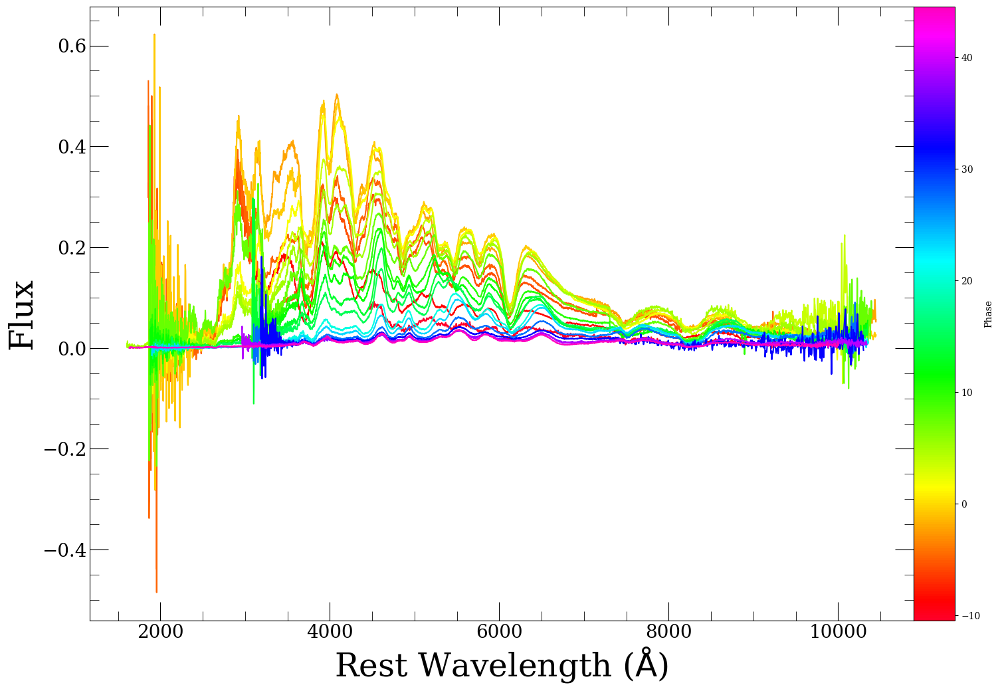

In [15]:
fc.plot_spectra(spec_array)

In [16]:
def interpspec(spec_array,dw=100,waverange=[4000,8000],plot=False):
    specnew = {}
    phases = []
    for i,spec in enumerate(spec_array):
        snew = {}
        wave = spec.wavelength[spec.x1:spec.x2]
        flux = spec.flux[spec.x1:spec.x2]
        ivar = spec.ivar[spec.x1:spec.x2]
        if plot:
            plt.plot(wave,flux)
        output, scale, var_final = prep.Interpo_flux_conserving(wave,flux,ivar,dw=dw)
        wave,flux,ivar = output[0],output[1],output[2]
        
        idx = np.array((wave>waverange[0]) & (wave<waverange[1]))
        idx_nan = ~np.isnan(flux)
        
        idx_nan_w1 = (wave<spec.wavelength[spec.x1])
        flux[idx_nan_w1] = np.median(flux[idx_nan][0:10])
        print (np.median(flux[idx_nan][0:10]))
        ivar[idx_nan_w1] = ivar[idx_nan][0]/1e3
        
        idx_nan_w2 = (wave>spec.wavelength[spec.x2])
        flux[idx_nan_w2] = np.median(flux[idx_nan][-10:])
        print (np.median(flux[idx_nan][-10:]))
        ivar[idx_nan_w2] = ivar[idx_nan][-1]/1e3
        
        snew['wavelength_interp'] = wave[idx]
        snew['flux_interp'] = flux[idx]
        snew['ivar_interp'] = ivar[idx]
        
#         flux[idx_nan] = 0.
#         ivar[idx_nan] = 0.
        
        phase = spec.phase
        phases.append(phase)
        
        specnew[phase] = snew
        if plot:
            plt.plot(wave[idx],flux[idx])
#             plt.plot(wave,flux)
        plt.title(str(phase))
        plt.show()
    return specnew, np.sort(phases), wave[idx]

[1606.0, 10450.0]
1.9215995257941632
0.2726837611026238


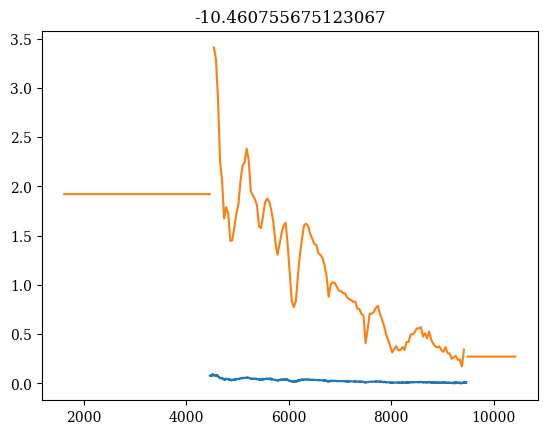

6.053140839695986
0.6850811969492993


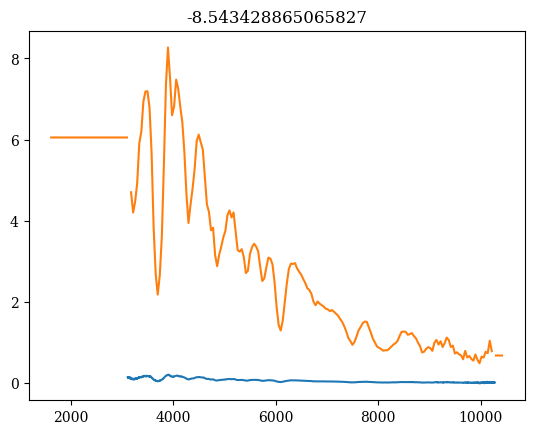

0.5333202720698136
0.8827898393026914


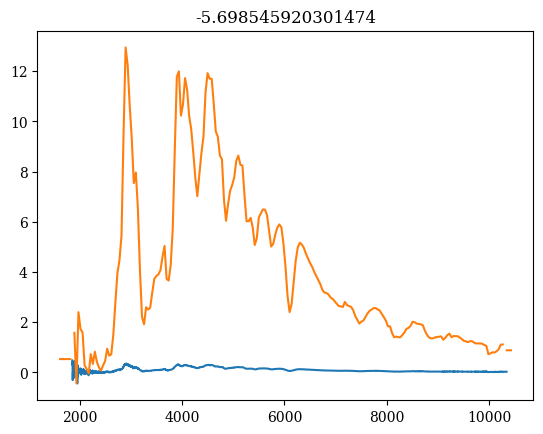

0.5889365388033502
0.9401918299379332


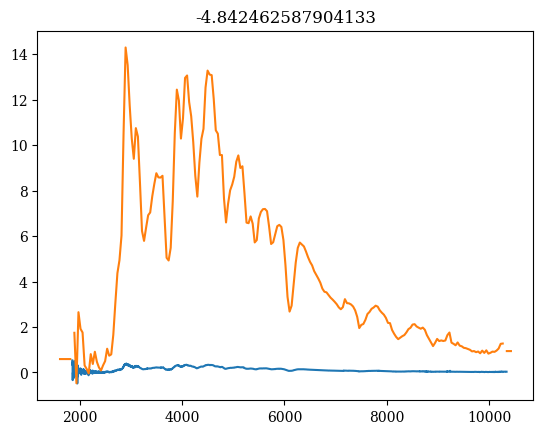

1.1296515768916773
1.564150138926602


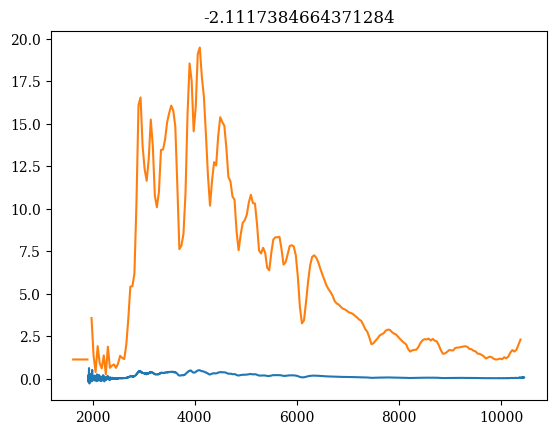

1.125410393851227
0.6207223458840988


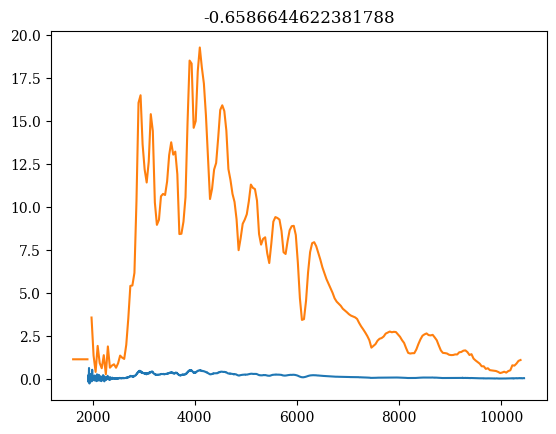

0.6318449998040594
0.9425497703982857


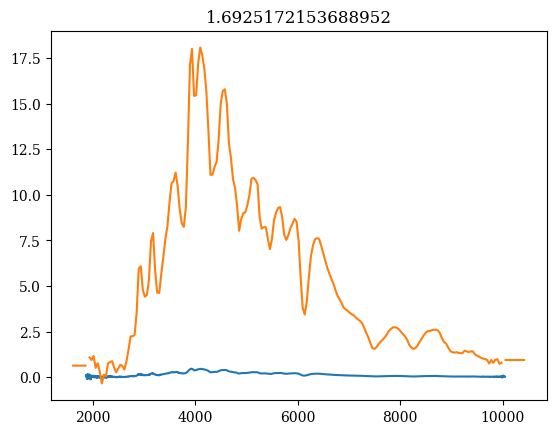

0.32152721459799916
2.3747959927882114


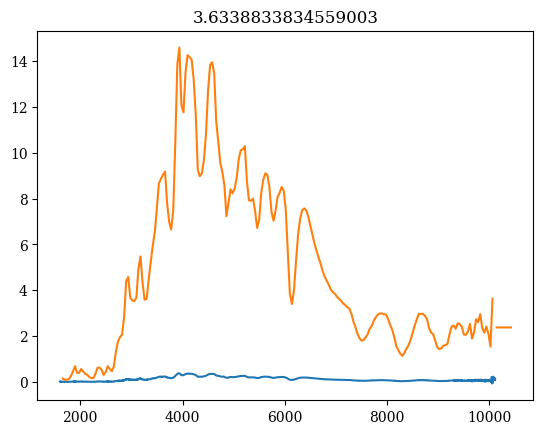

0.2735410348300432
1.25910422463607


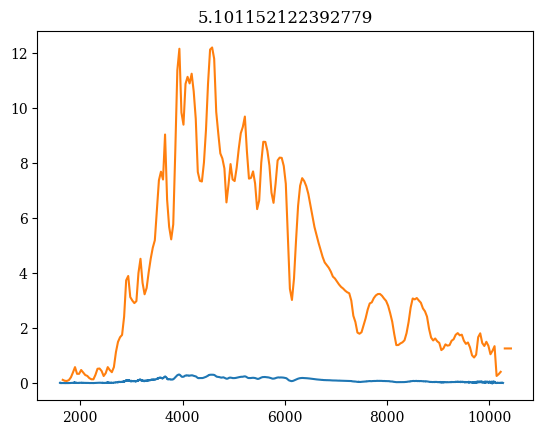

0.9437155927847258
1.4912505356865942


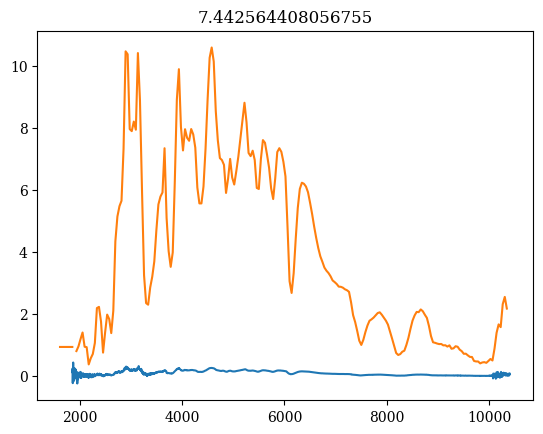

0.18014684087910876
1.6772804350274981


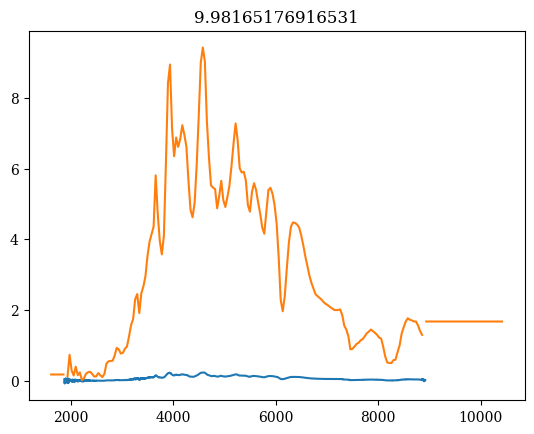

0.1286051985306872
0.7533797843098058


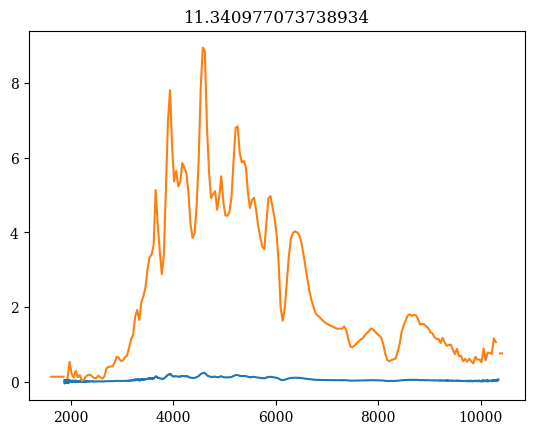

1.2923223469520209
0.67838436366251


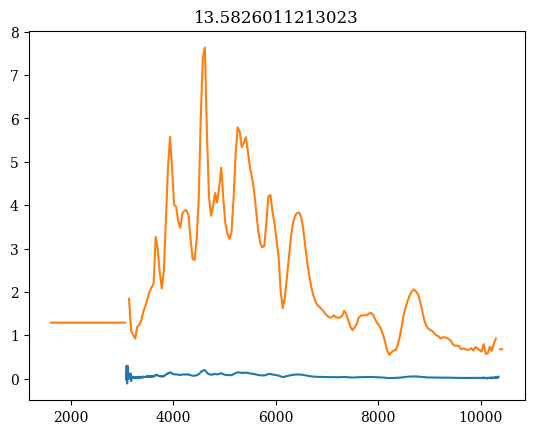

0.07672626547952119
0.8375110324970398


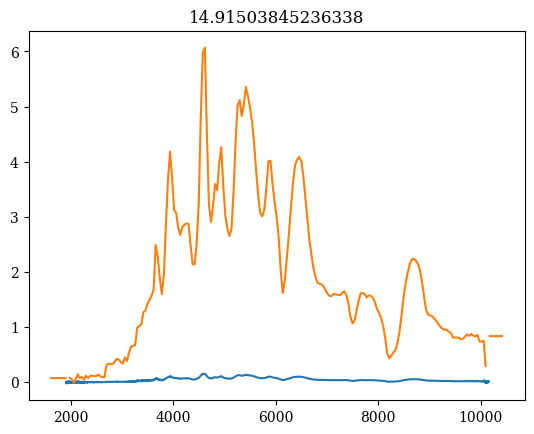

0.03491031415374589
0.5831343323863889


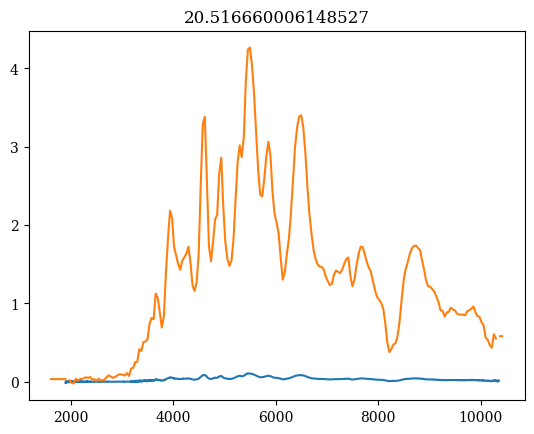

0.03130301681799022
0.604544153259347


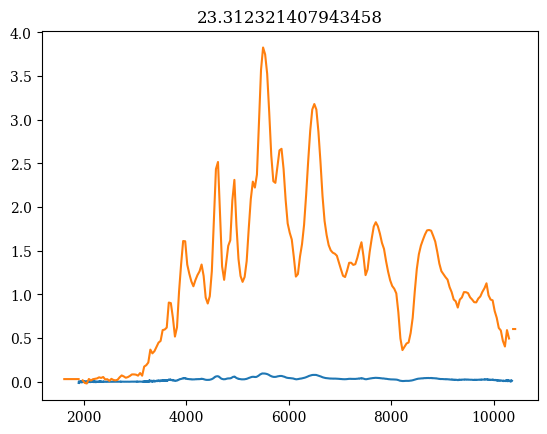

0.32065520879491827
1.0677039244572895


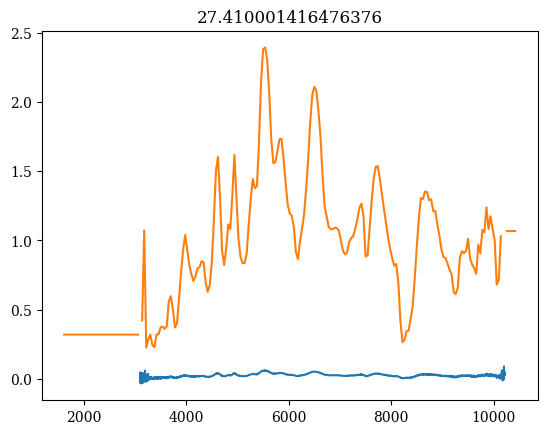

0.4401583164992838
0.8757764898033902


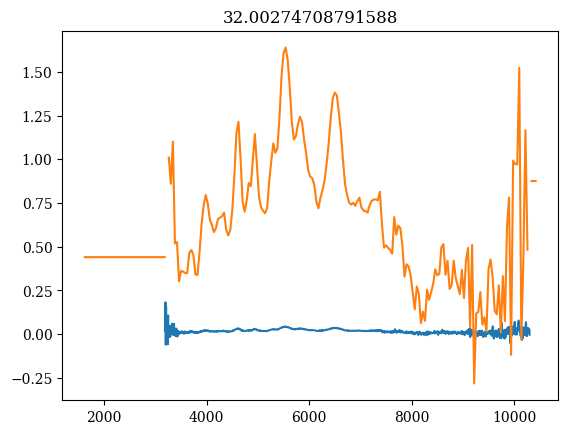

0.24612459466478714
0.4871912225365482


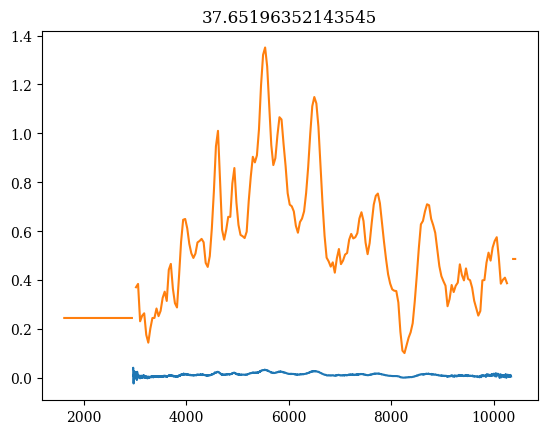

0.2318299162031855
0.4649228069161259


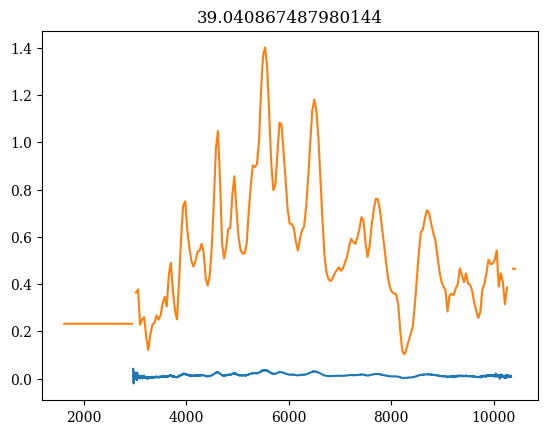

0.03721296430887871
0.20538301019306066


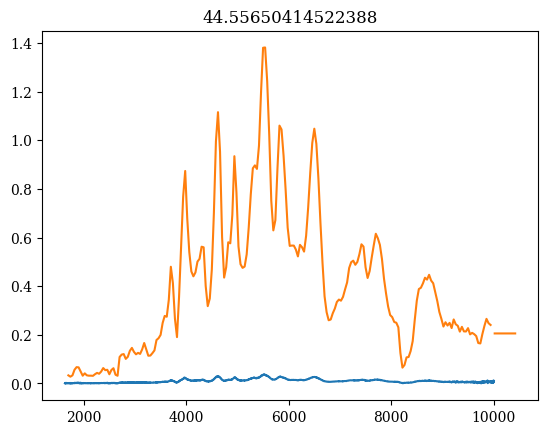

[-10.46075568  -8.54342887  -5.69854592  -4.84246259  -2.11173847
  -0.65866446   1.69251722   3.63388338   5.10115212   7.44256441
   9.98165177  11.34097707  13.58260112  14.91503845  20.51666001
  23.31232141  27.41000142  32.00274709  37.65196352  39.04086749
  44.55650415]
[ 1619.  1659.  1699.  1739.  1779.  1819.  1859.  1899.  1939.  1979.
  2019.  2059.  2099.  2139.  2179.  2219.  2259.  2299.  2339.  2379.
  2419.  2459.  2499.  2539.  2579.  2619.  2659.  2699.  2739.  2779.
  2819.  2859.  2899.  2939.  2979.  3019.  3059.  3099.  3139.  3179.
  3219.  3259.  3299.  3339.  3379.  3419.  3459.  3499.  3539.  3579.
  3619.  3659.  3699.  3739.  3779.  3819.  3859.  3899.  3939.  3979.
  4019.  4059.  4099.  4139.  4179.  4219.  4259.  4299.  4339.  4379.
  4419.  4459.  4499.  4539.  4579.  4619.  4659.  4699.  4739.  4779.
  4819.  4859.  4899.  4939.  4979.  5019.  5059.  5099.  5139.  5179.
  5219.  5259.  5299.  5339.  5379.  5419.  5459.  5499.  5539.  5579.
  5619.  56

In [17]:
spec_arr_new = []
minwaves = []
maxwaves = []
for spec in spec_array:
    minwaves.append(spec.wavelength[spec.x1])
    maxwaves.append(spec.wavelength[spec.x2])
wrange = [np.amin(minwaves), np.amax(maxwaves)]
print (wrange)

for spec in spec_array:
    if spec.phase < 90:
        spec_arr_new.append(spec)
specnew, phases, waves = interpspec(spec_arr_new,dw=40,waverange=wrange,plot=True)
print (phases)
print (waves)

In [18]:
def spec2d(spec):
    nwave = np.shape(spec[list(spec.keys())[0]]['wavelength_interp'])[0]
    nphase = len(list(spec.keys()))
    print(nwave,nphase)
    arr2d = np.ones((nphase*nwave,4))
    for i,phase in enumerate(np.sort(list(spec.keys()))):
        arr2d[i*nwave:(i+1)*nwave,0] = [float(phase)]*nwave
        arr2d[i*nwave:(i+1)*nwave,1] = spec[phase]['wavelength_interp']
        arr2d[i*nwave:(i+1)*nwave,2] = spec[phase]['flux_interp']
        arr2d[i*nwave:(i+1)*nwave,3] = spec[phase]['ivar_interp']
    return arr2d 

def spec2d_test(spec):
    nwave = np.shape(spec[list(spec.keys())[0]]['wavelength_interp'])[0]
    nphase = len(list(spec.keys()))
#     print(nwave,nphase)
#     arr2d = np.ones((nphase*nwave,4))
    arr2d = []
    for i,phase in enumerate(np.sort(list(spec.keys()))):
#         print (i,phase)
#         print (spec[phase]['flux_interp'])
        nan_locs = np.where(np.isnan(spec[phase]['flux_interp']))[0]
        for nanl in nan_locs:
            if nanl - 5 < 0:
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl:nanl+5])
            elif nanl + 5 >= len(spec[phase]['flux_interp']):
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl-5:nanl])
            else: 
                spec[phase]['flux_interp'][nanl] = np.nanmedian(spec[phase]['flux_interp'][nanl-5:nanl+5])
        arr2d.append(spec[phase]['flux_interp'])
#         arr2d[i*nwave:(i+1)*nwave,0] = [float(phase)]*nwave
#         arr2d[i*nwave:(i+1)*nwave,1] = spec[phase]['wavelength_interp']
#         arr2d[i*nwave:(i+1)*nwave,2] = spec[phase]['flux_interp']
#         arr2d[i*nwave:(i+1)*nwave,3] = spec[phase]['ivar_interp']
    return arr2d

(21, 221)
[[1.92159953 1.92159953 1.92159953 ... 0.27268376 0.27268376 0.27268376]
 [1.92159953 1.92159953 1.92159953 ... 0.27268376 0.27268376 0.27268376]
 [1.92159953 1.92159953 1.92159953 ... 0.27268376 0.27268376 0.27268376]
 ...
 [0.03721296 0.03298781 0.03295946 ... 0.20538301 0.20538301 0.20538301]
 [0.03721296 0.03298781 0.03295946 ... 0.20538301 0.20538301 0.20538301]
 [0.03721296 0.03298781 0.03295946 ... 0.20538301 0.20538301 0.20538301]]


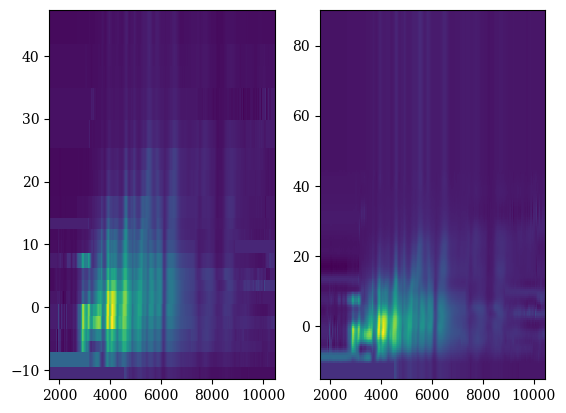

In [19]:
spec_arr = spec2d_test(specnew)
print (np.shape(spec_arr))
# print (spec_arr)

x = waves
y = phases
X, Y = np.meshgrid(x, y)
Z = spec_arr

x2 = waves
y2 = np.linspace(-15, 90, 200)
f = interp2d(x, y, Z, kind='cubic')
Z2 = f(x2, y2)

fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].pcolormesh(X, Y, Z)
X2, Y2 = np.meshgrid(x2, y2)
ax[1].pcolormesh(X2, Y2, Z2)
print (Z2)
plt.show()

-15.0


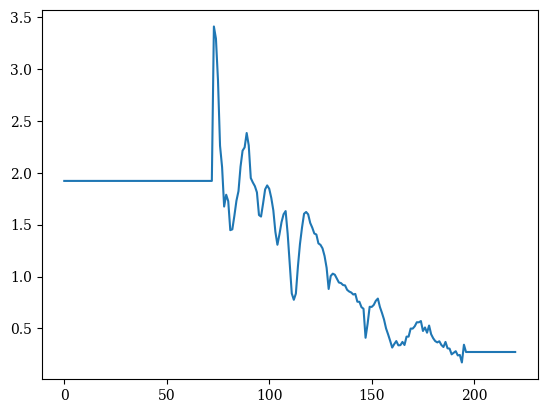

-14.472361809045227


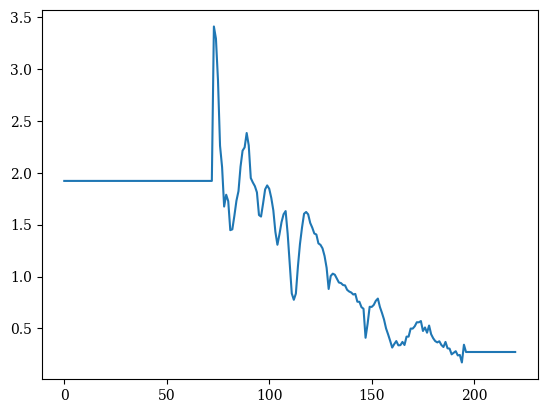

-13.944723618090453


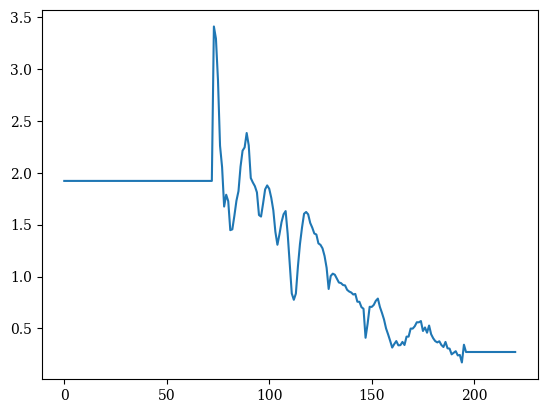

-13.417085427135678


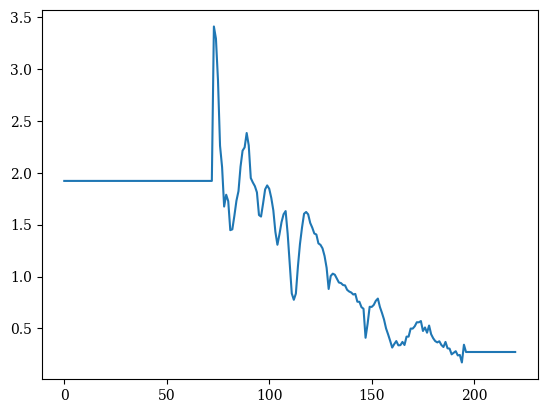

-12.889447236180905


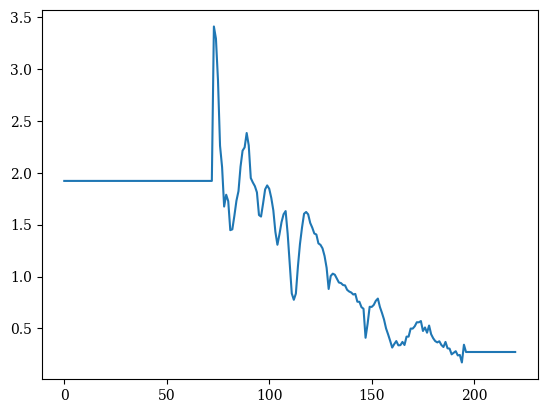

-12.361809045226131


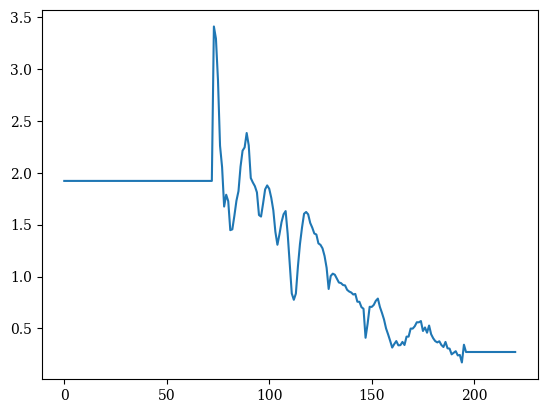

-11.834170854271356


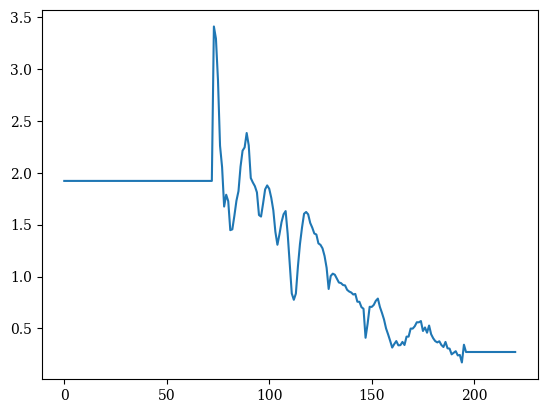

-11.306532663316583


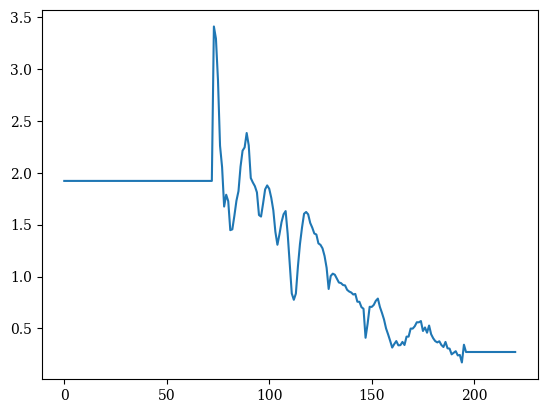

-10.77889447236181


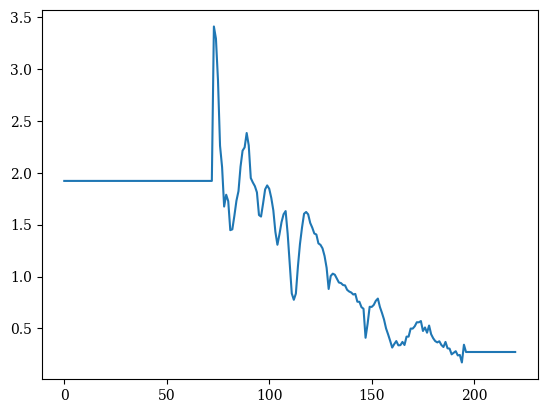

-10.251256281407036


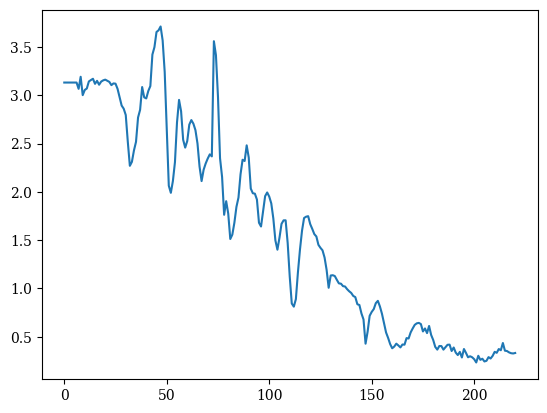

-9.723618090452263


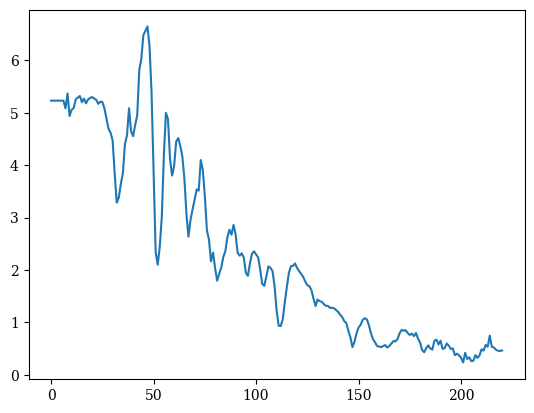

-9.195979899497488


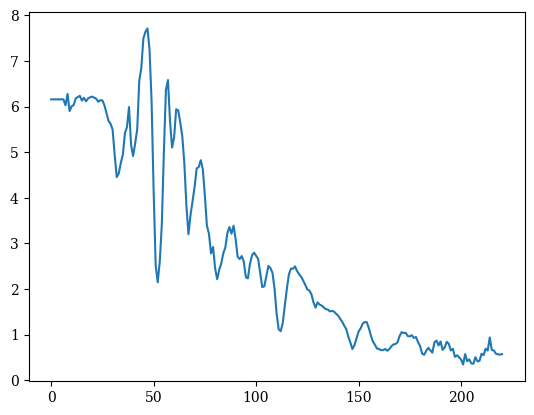

-8.668341708542714


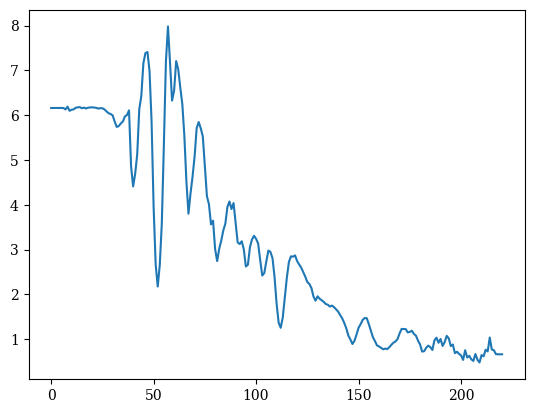

-8.14070351758794


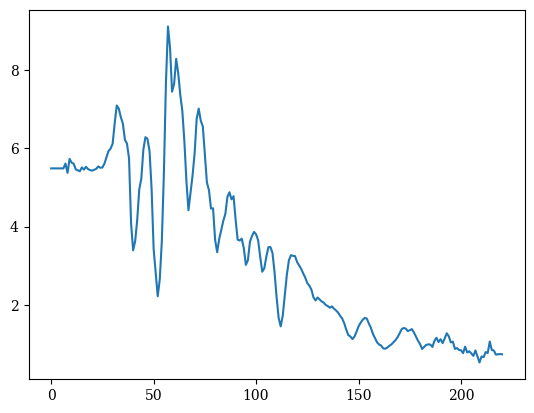

-7.6130653266331665


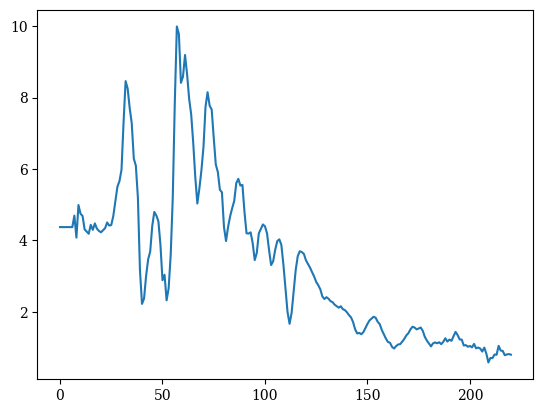

-7.085427135678392


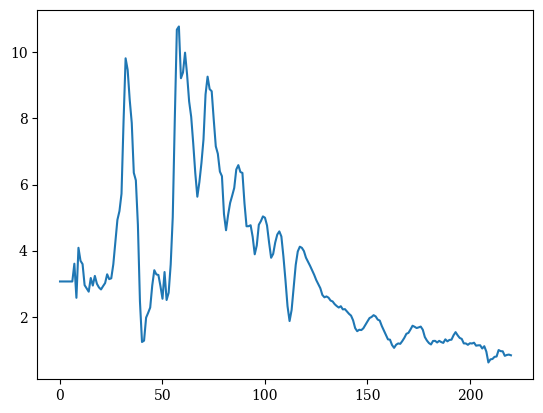

-6.557788944723619


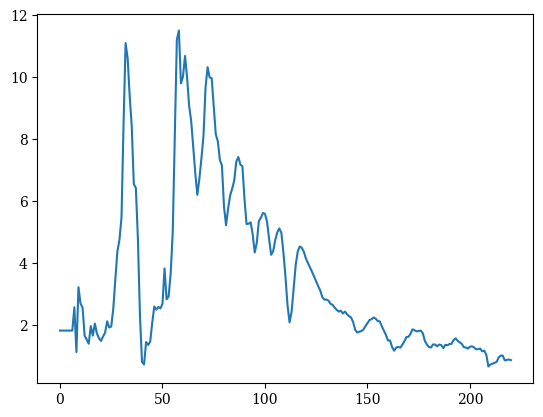

-6.0301507537688455


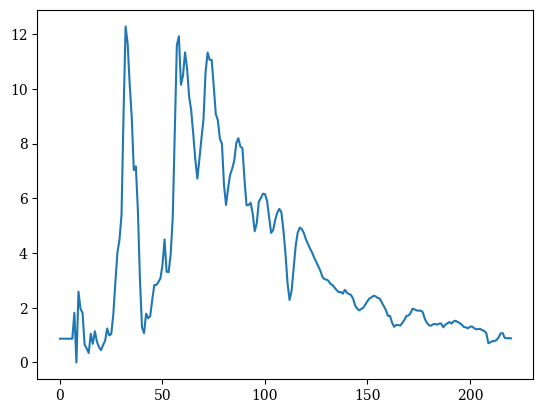

-5.502512562814072


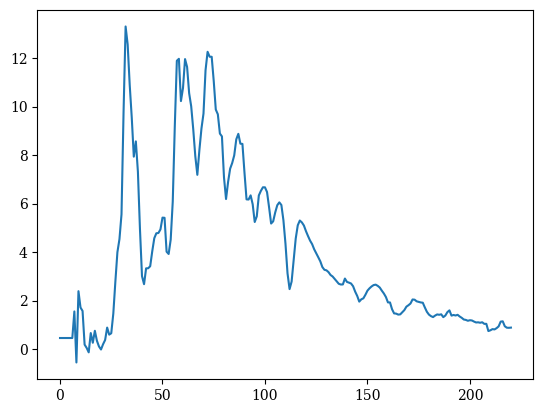

-4.974874371859297


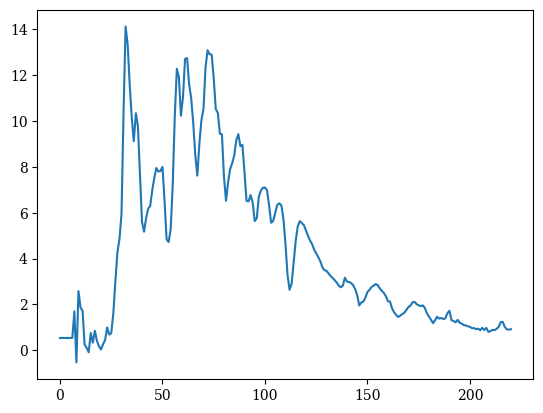

-4.4472361809045236


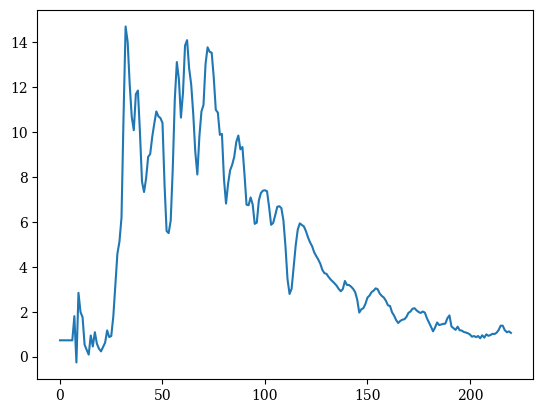

-3.91959798994975


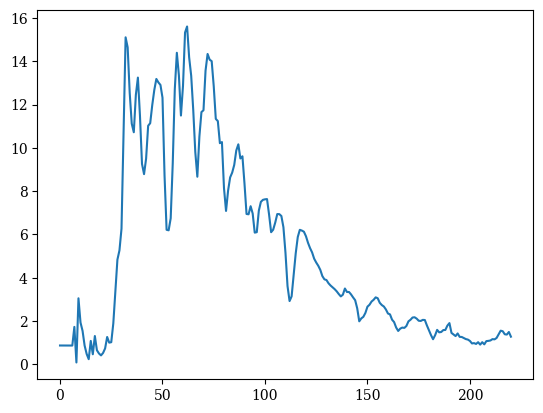

-3.391959798994975


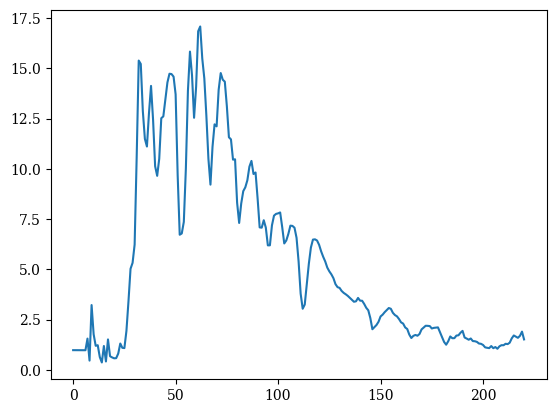

-2.8643216080402016


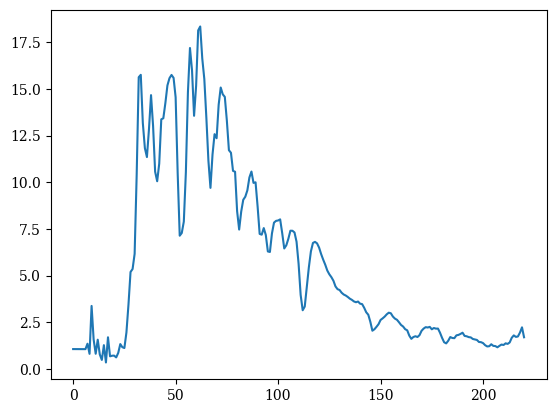

-2.3366834170854283


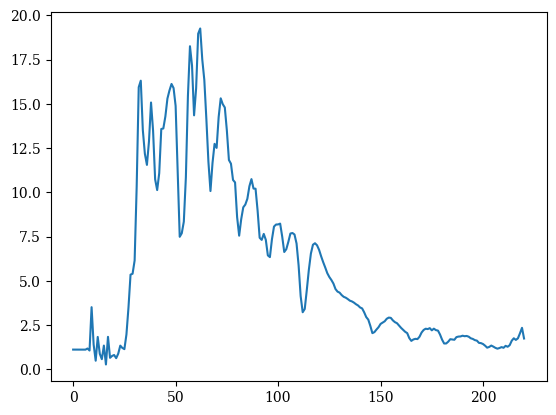

-1.8090452261306549


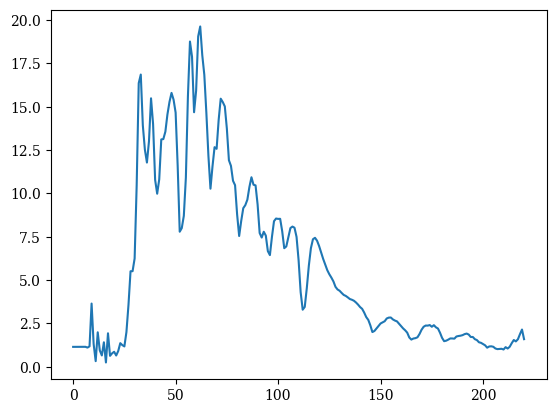

-1.2814070351758815


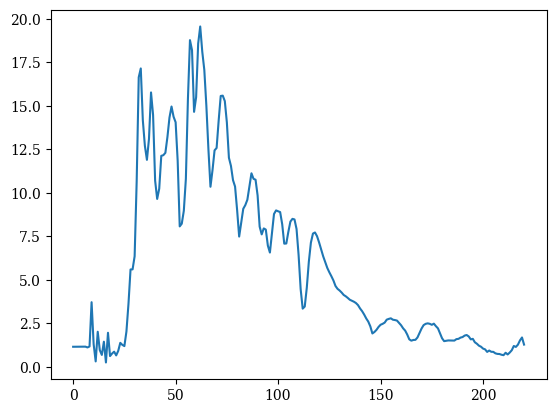

-0.7537688442211063


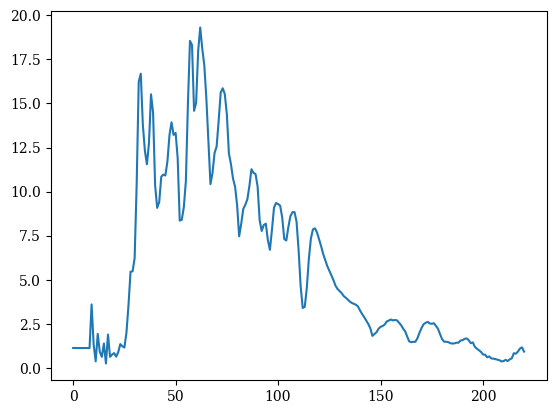

-0.22613065326633297


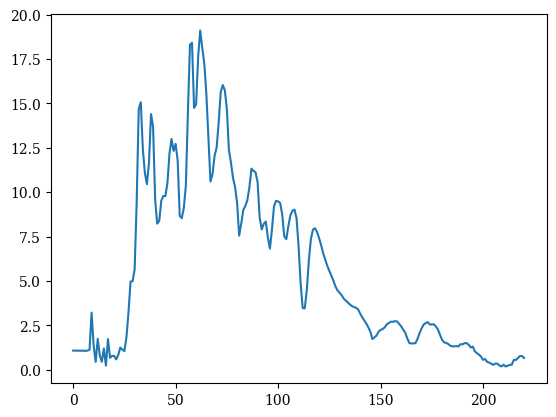

0.3015075376884404


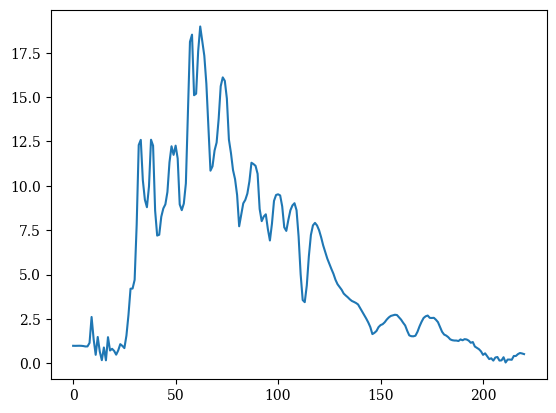

0.8291457286432156


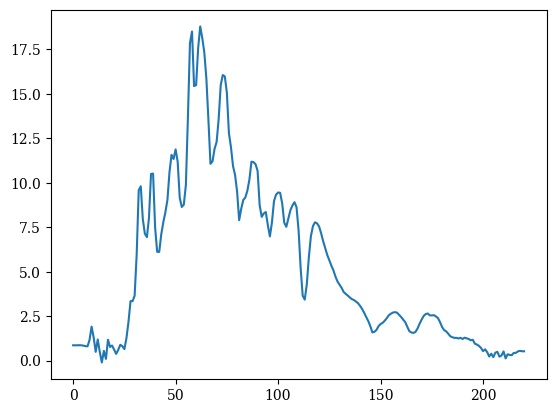

1.3567839195979872


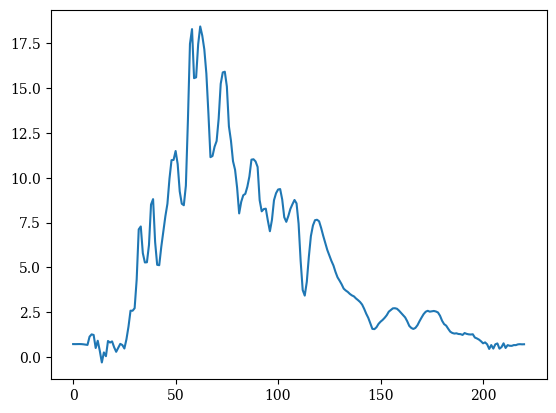

1.8844221105527623


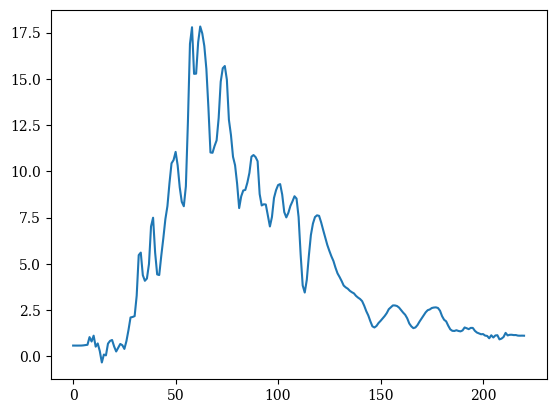

2.4120603015075375


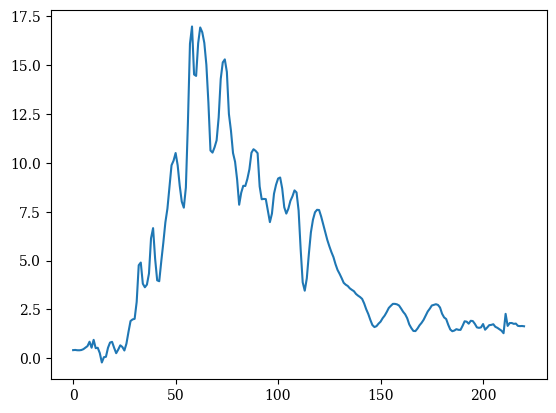

2.939698492462309


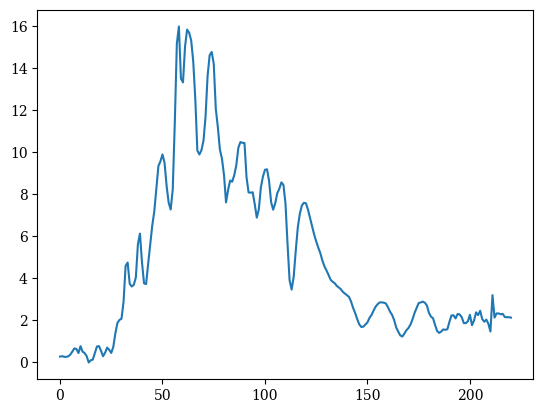

3.4673366834170842


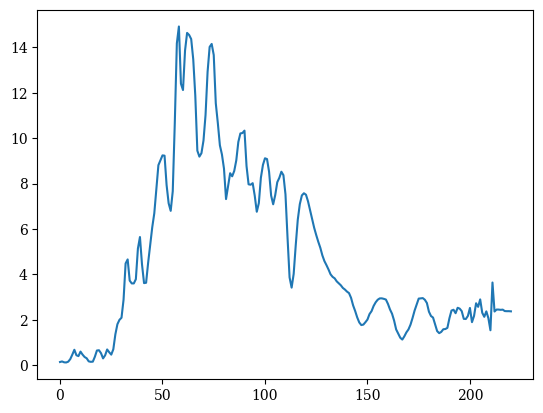

3.994974874371856


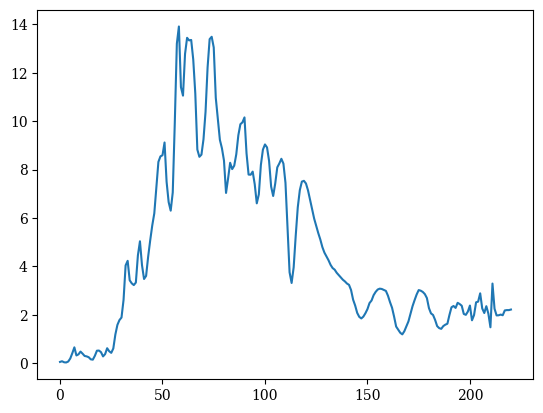

4.522613065326631


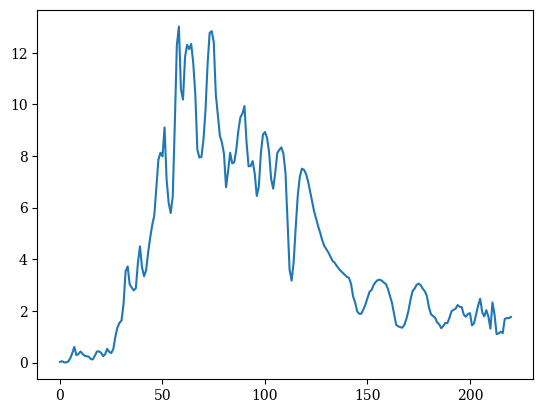

5.050251256281406


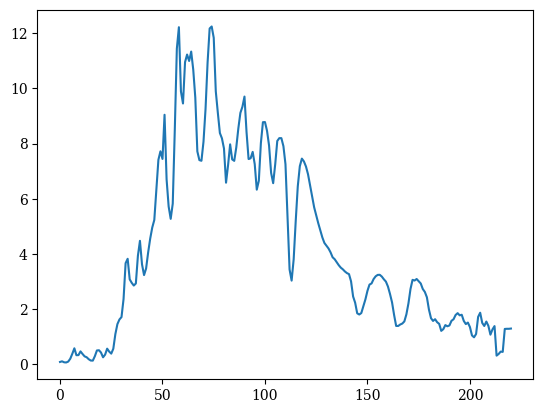

5.577889447236178


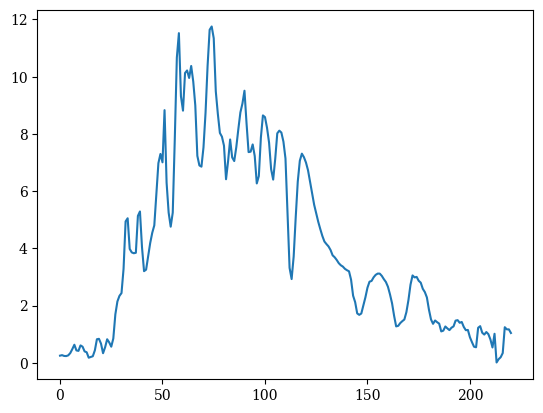

6.105527638190953


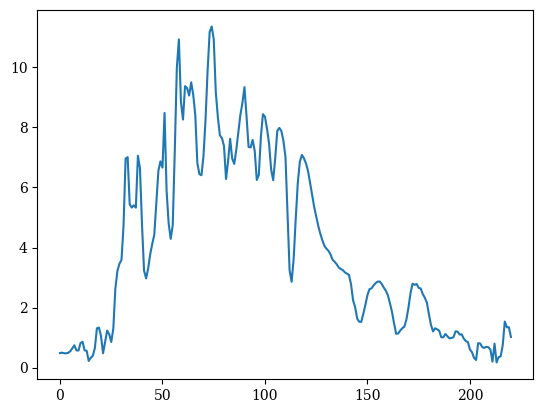

6.633165829145728


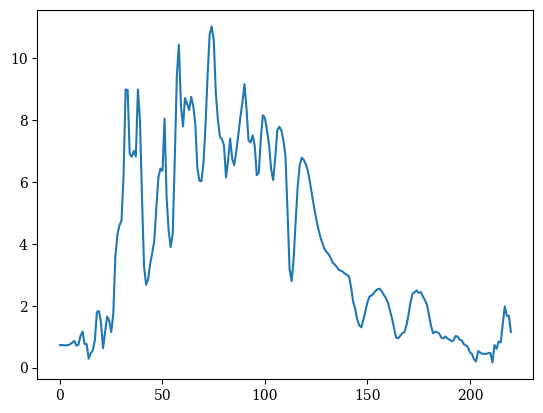

7.1608040201005


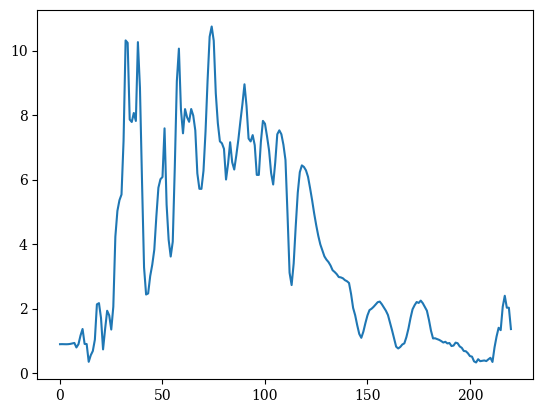

7.688442211055275


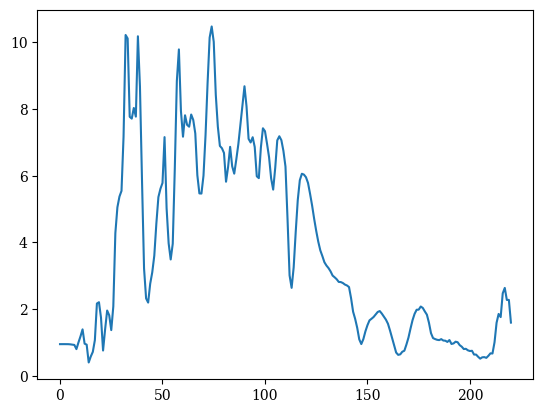

8.21608040201005


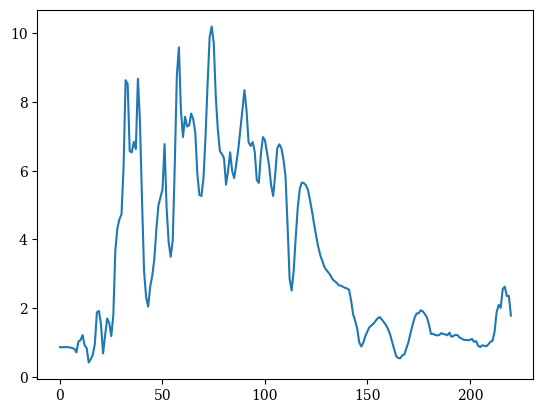

8.743718592964822


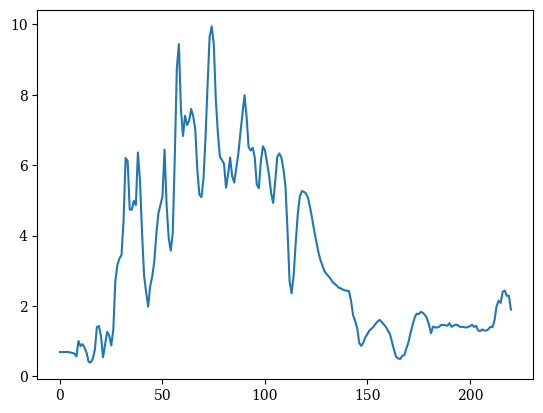

9.271356783919597


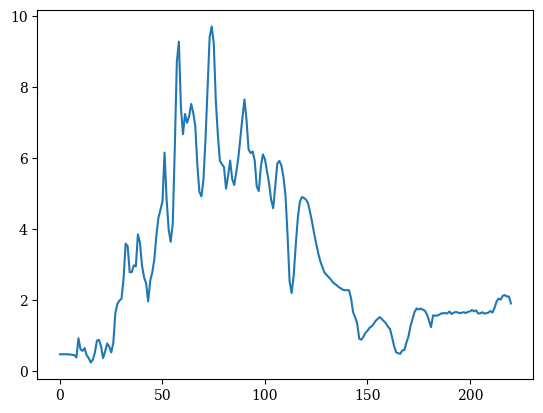

9.798994974874368


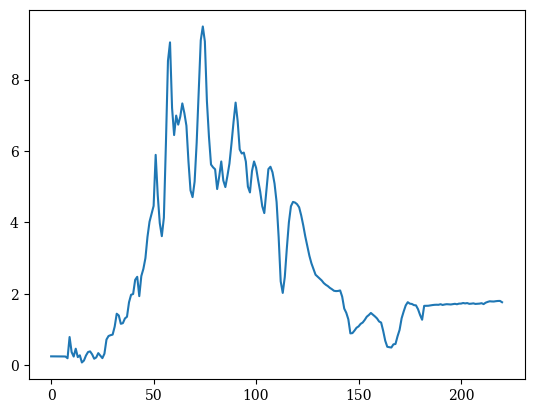

10.326633165829143


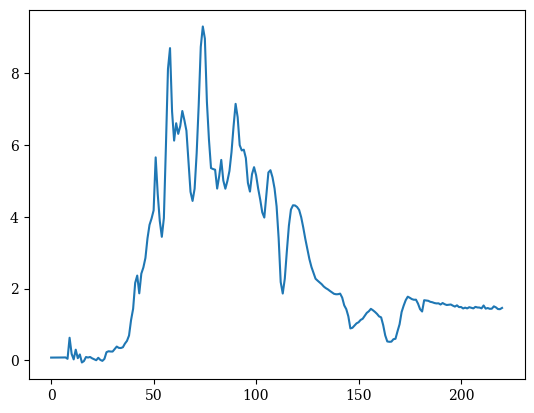

10.854271356783919


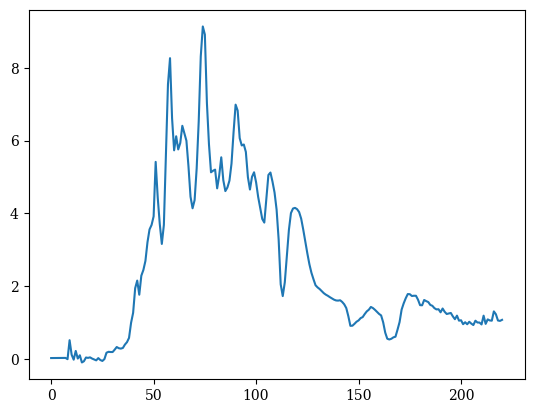

11.38190954773869


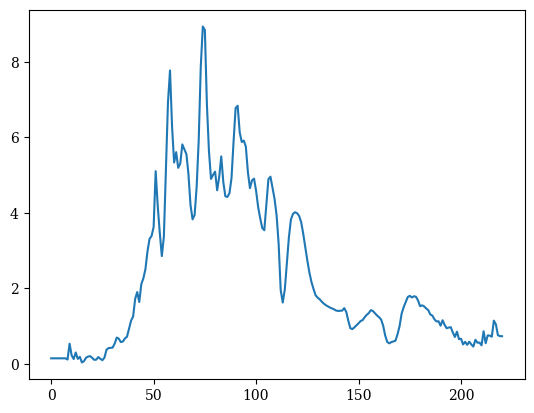

11.909547738693465


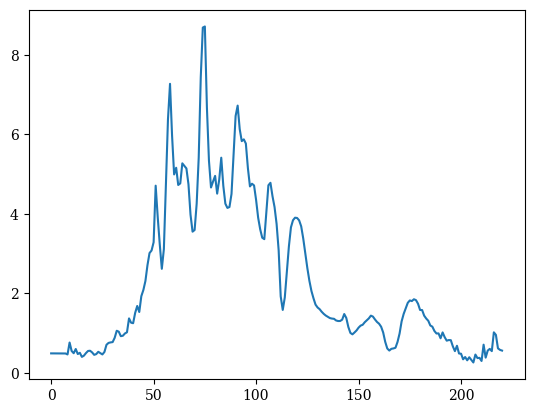

12.437185929648237


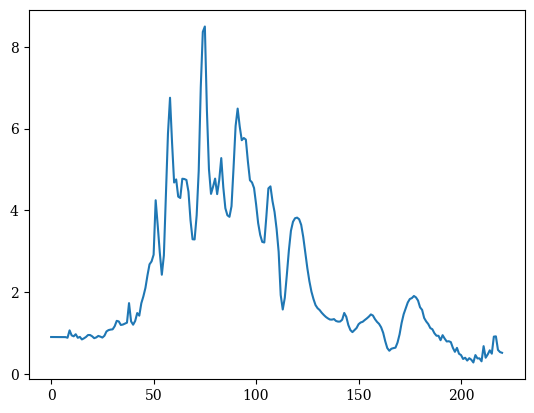

12.964824120603012


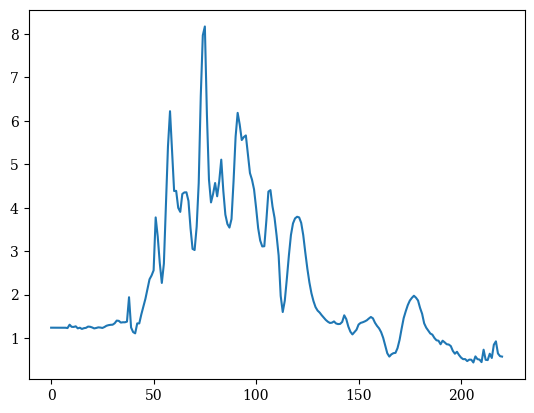

13.492462311557787


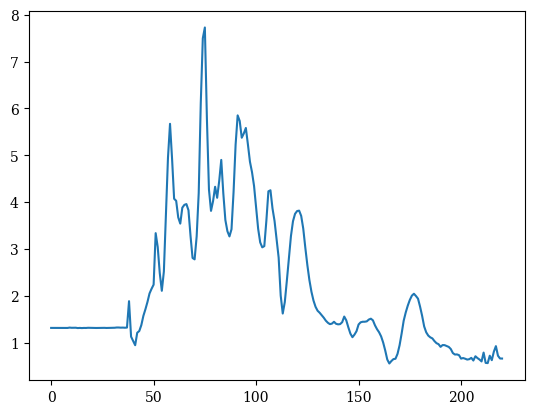

14.020100502512559


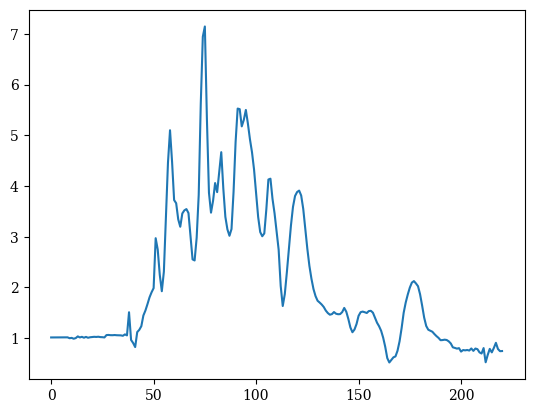

14.547738693467334


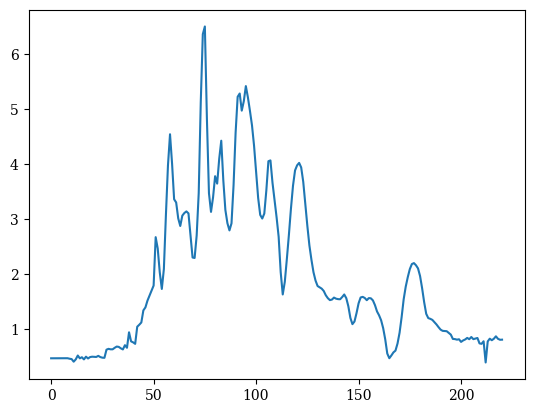

15.07537688442211


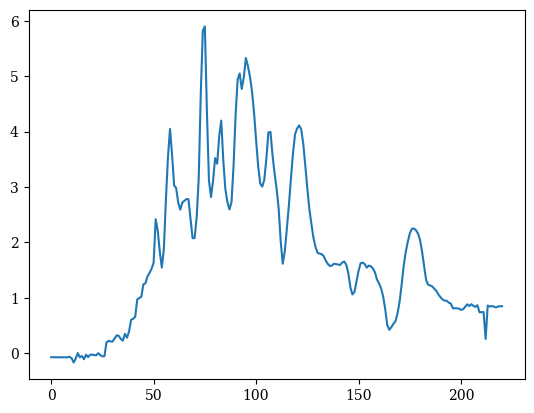

15.60301507537688


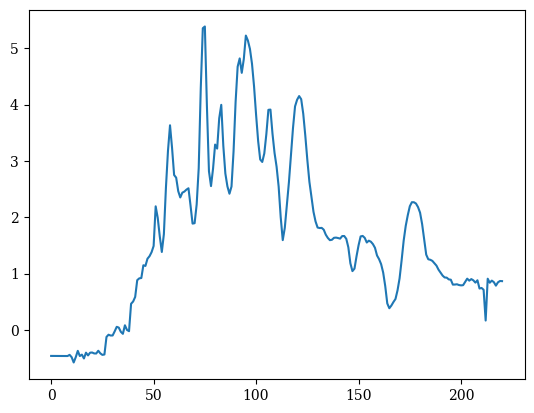

16.130653266331656


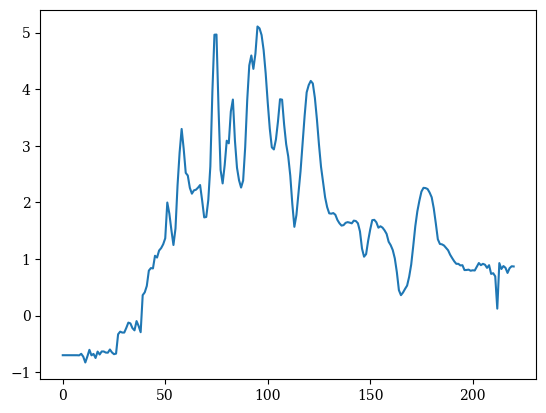

16.65829145728643


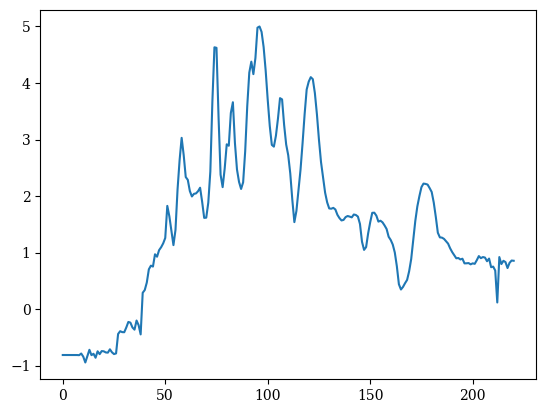

17.185929648241206


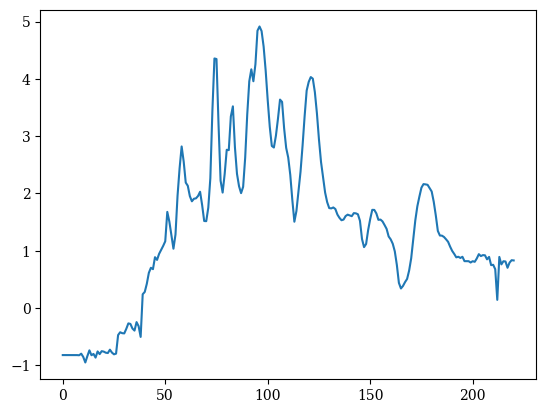

17.713567839195974


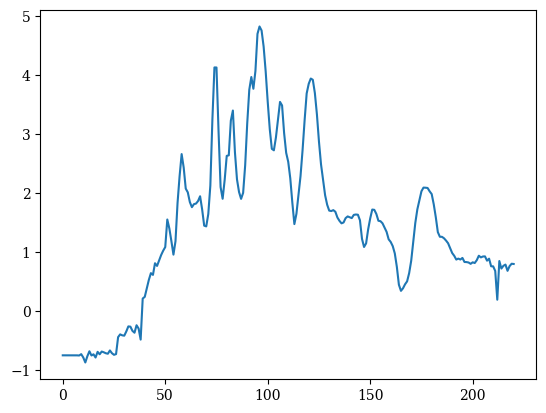

18.24120603015075


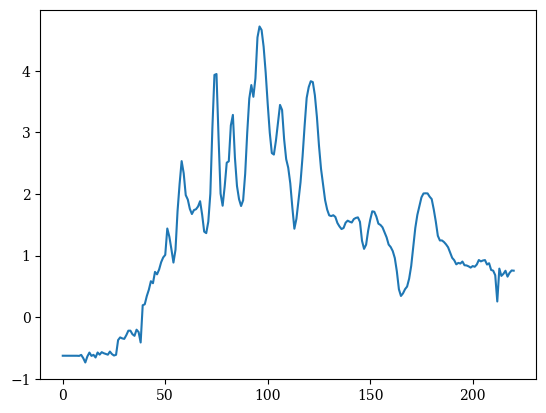

18.768844221105525


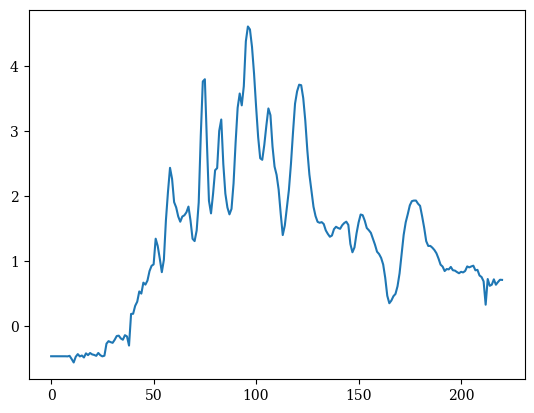

19.2964824120603


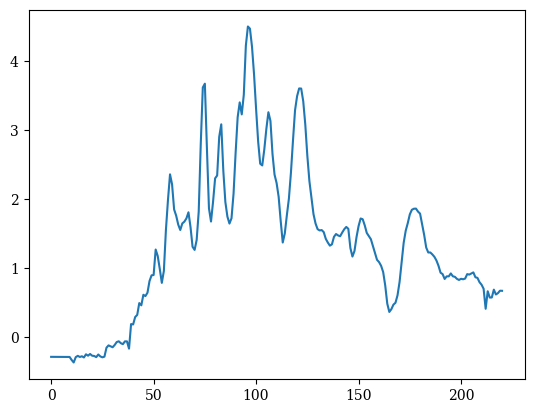

19.824120603015075


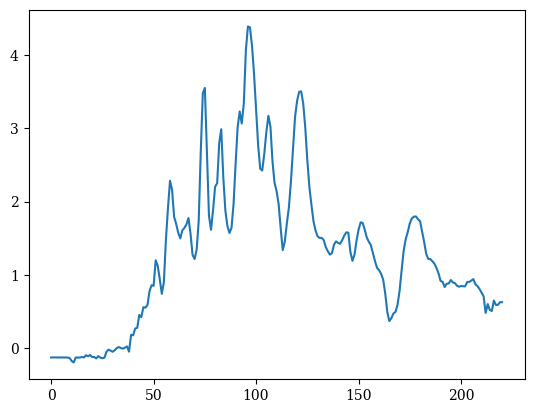

20.351758793969843


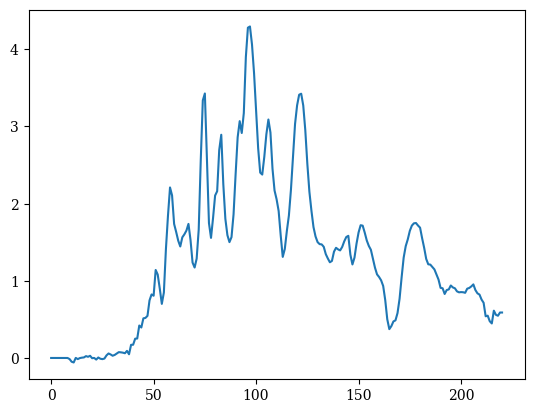

20.879396984924618


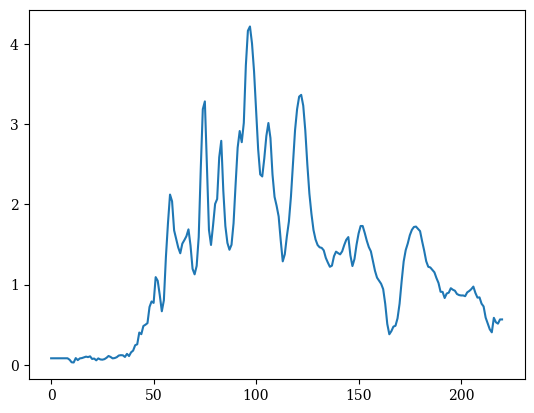

21.407035175879393


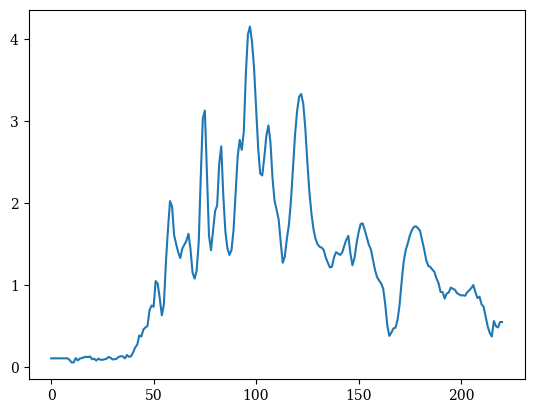

21.93467336683417


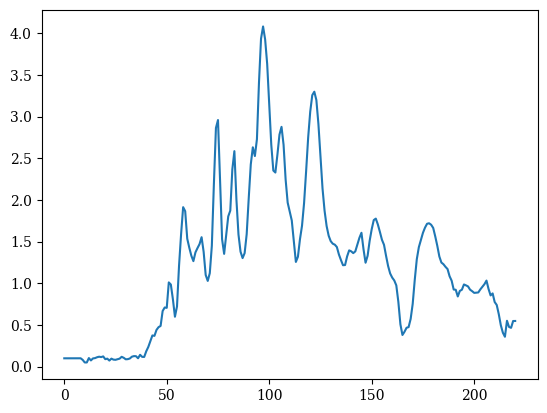

22.462311557788944


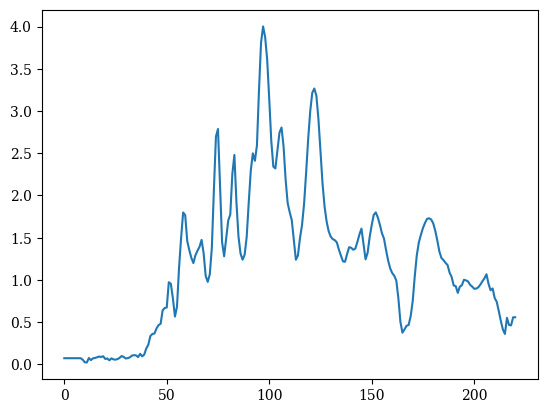

22.98994974874371


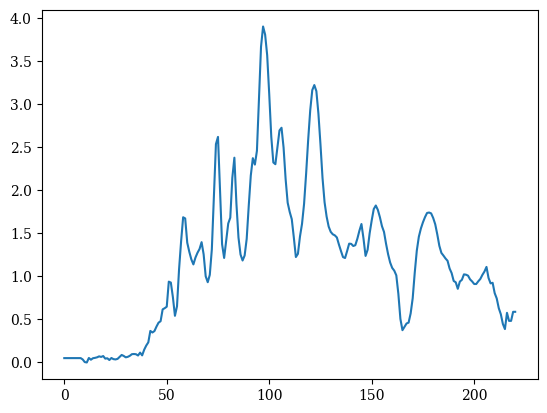

23.517587939698487


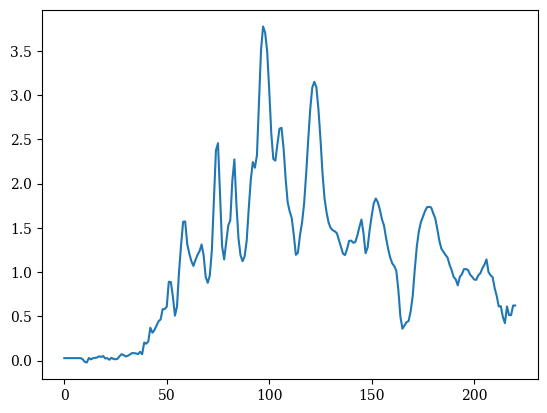

24.045226130653262


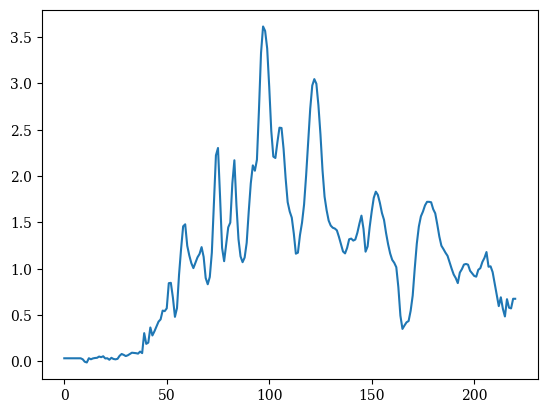

24.572864321608037


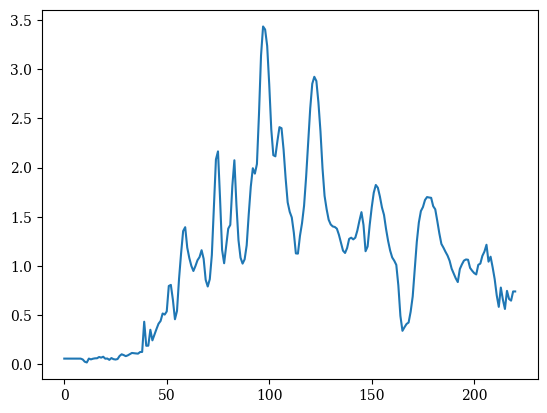

25.100502512562812


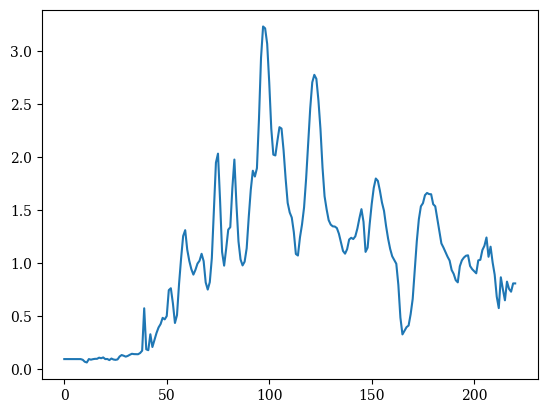

25.628140703517587


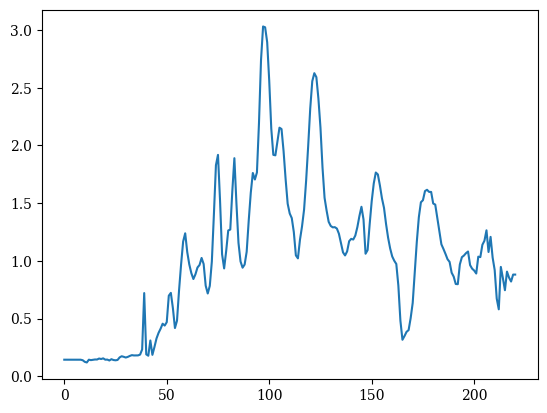

26.155778894472355


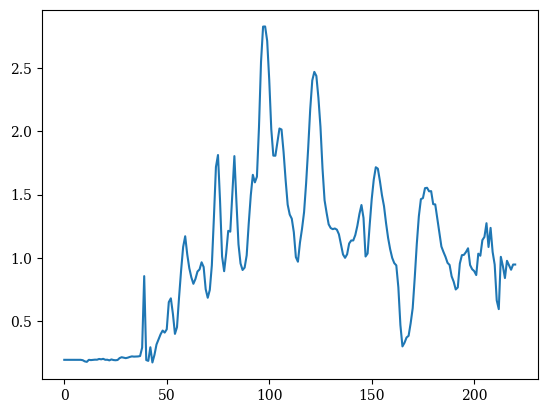

26.68341708542713


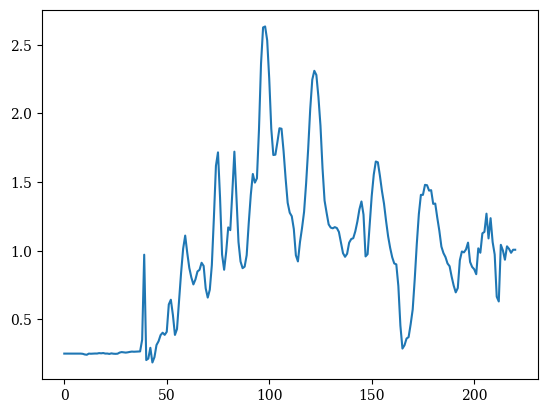

27.211055276381906


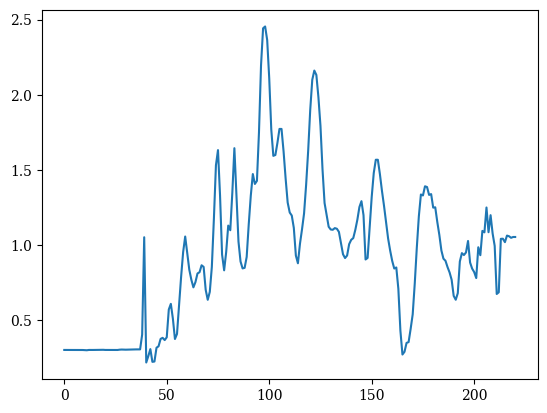

27.73869346733668


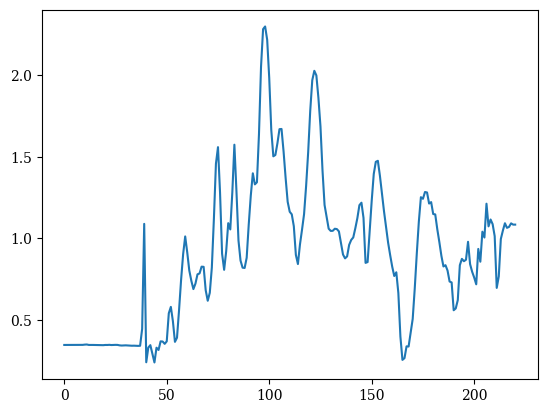

28.266331658291456


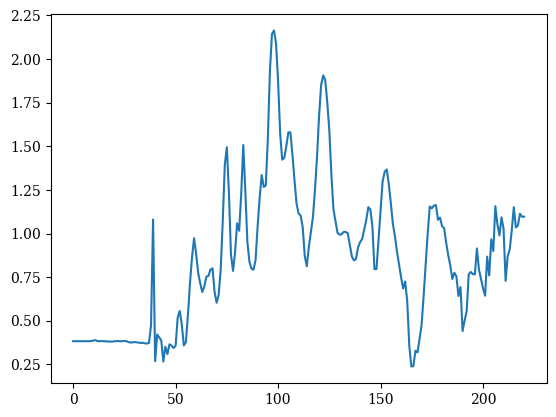

28.793969849246224


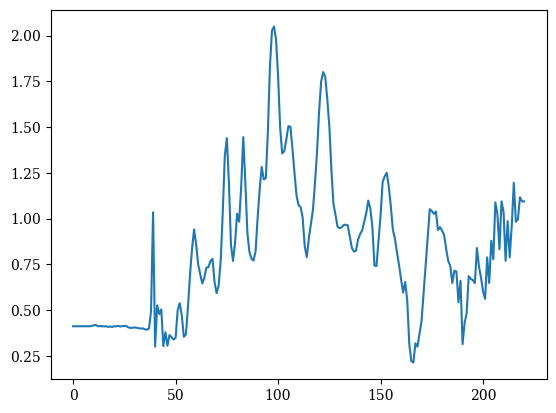

29.321608040201


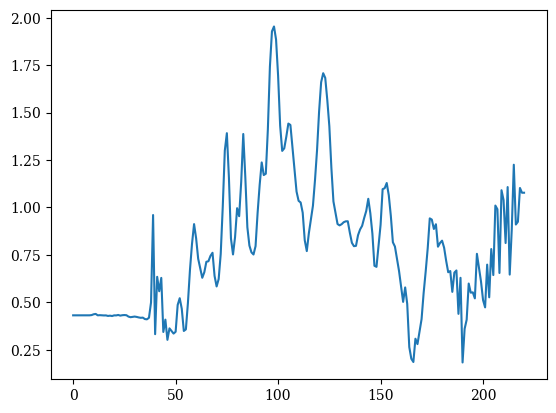

29.849246231155774


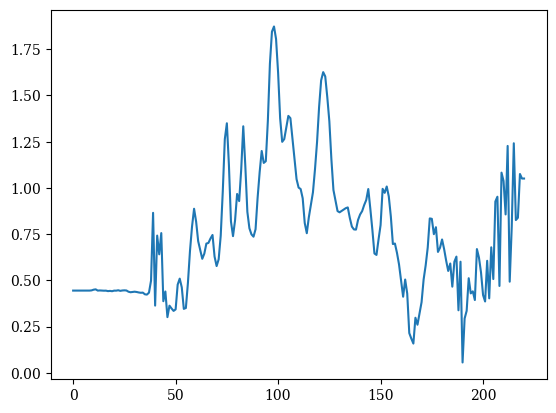

30.37688442211055


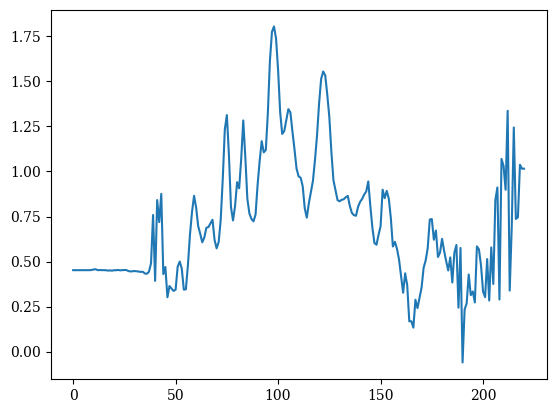

30.904522613065325


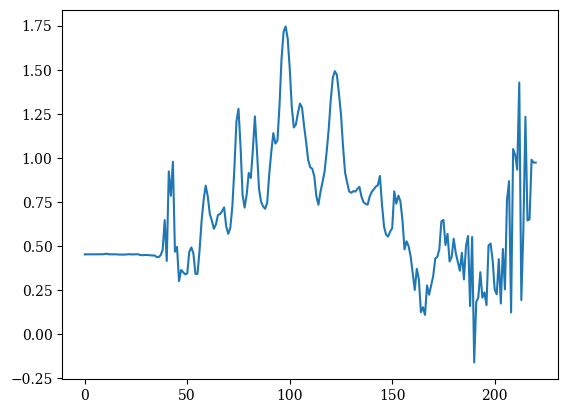

31.4321608040201


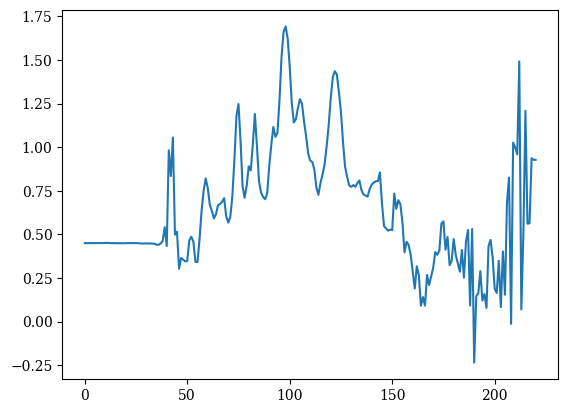

31.959798994974868


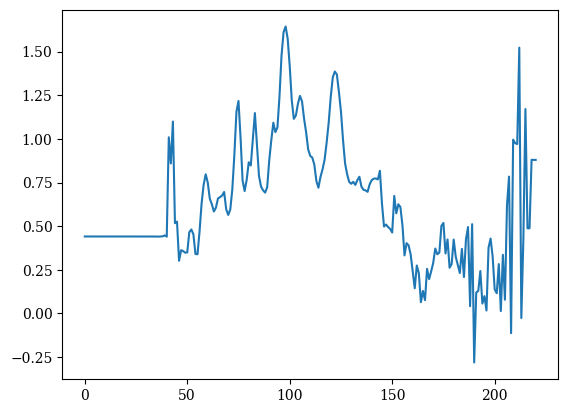

32.48743718592964


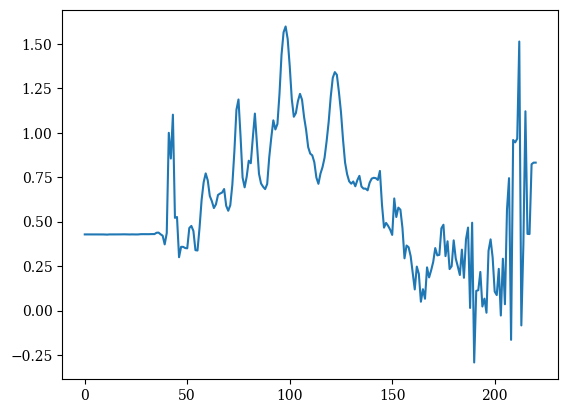

33.01507537688442


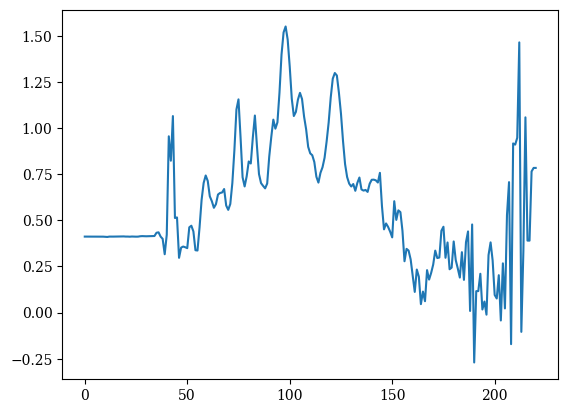

33.54271356783919


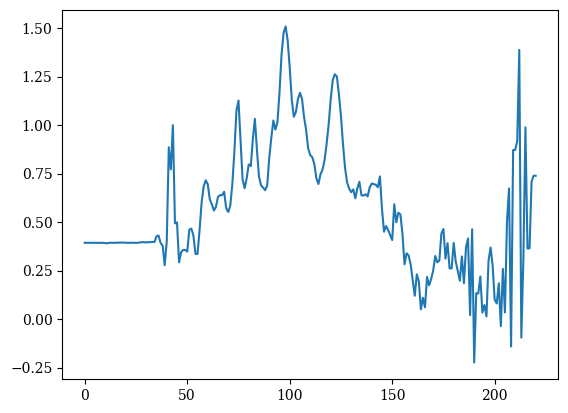

34.07035175879397


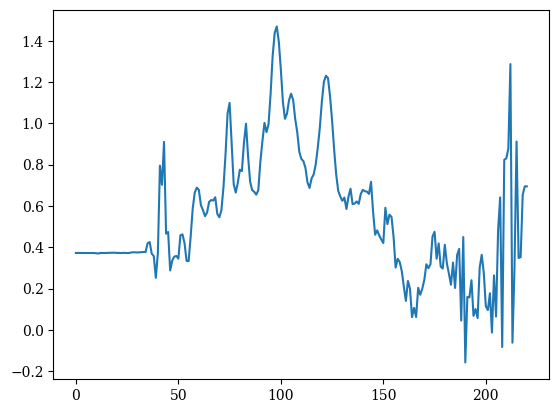

34.59798994974874


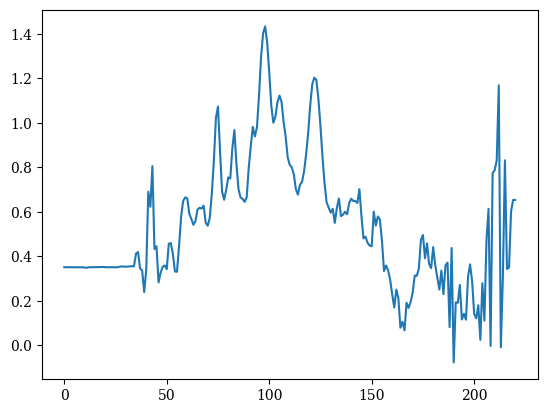

35.12562814070351


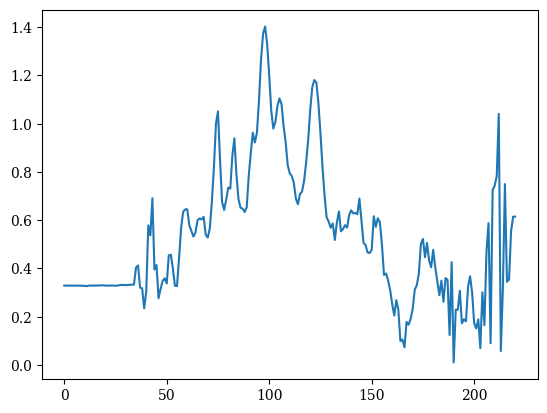

35.65326633165829


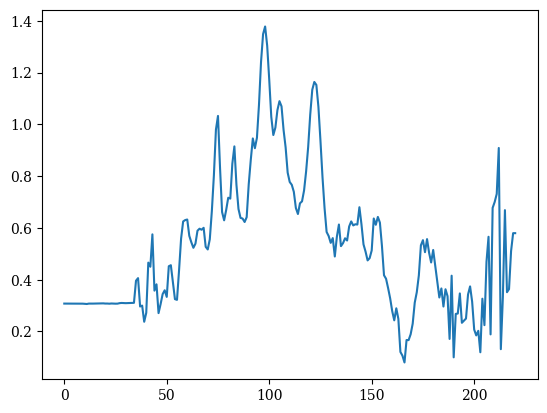

36.18090452261306


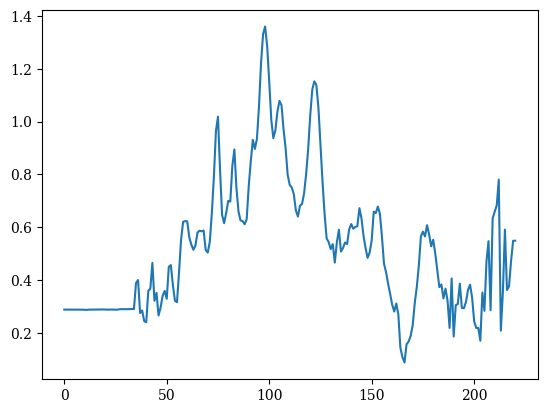

36.70854271356784


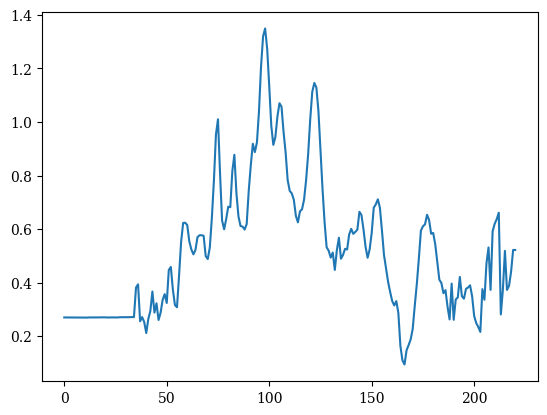

37.236180904522605


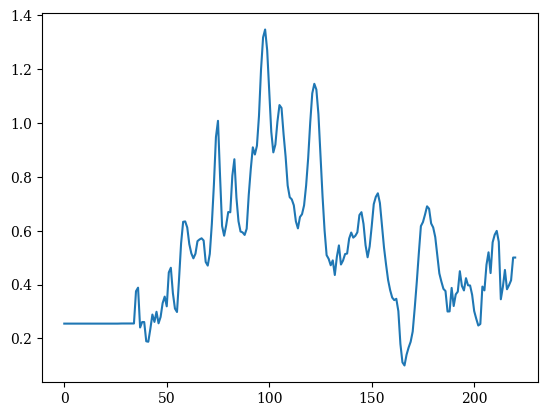

37.76381909547738


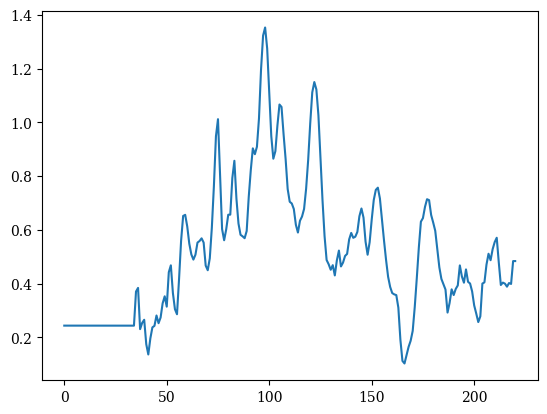

38.291457286432156


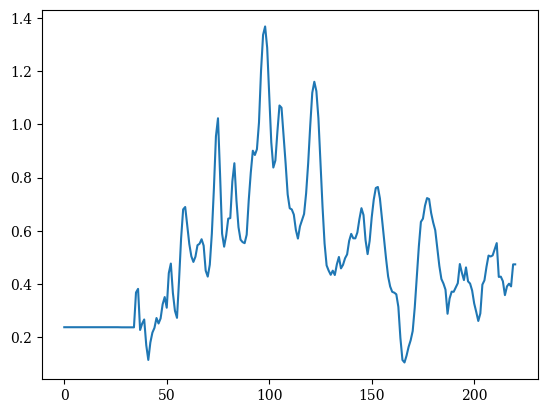

38.81909547738693


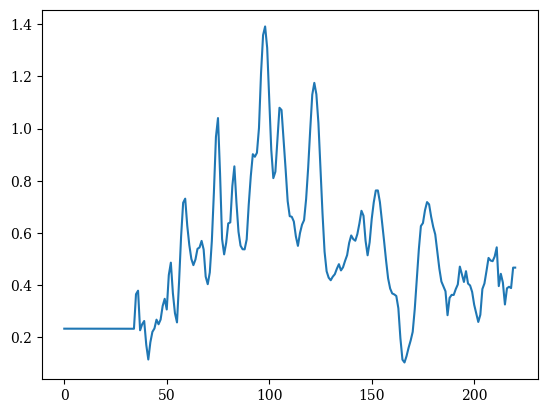

39.346733668341706


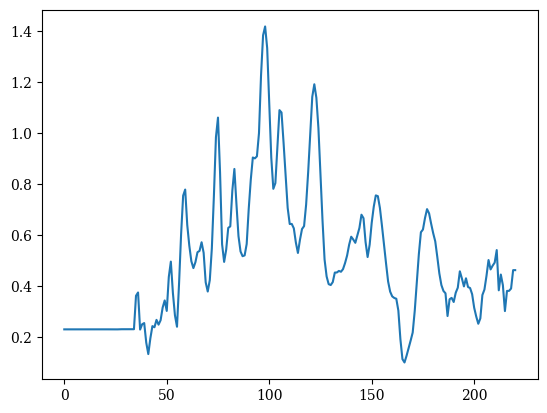

39.874371859296474


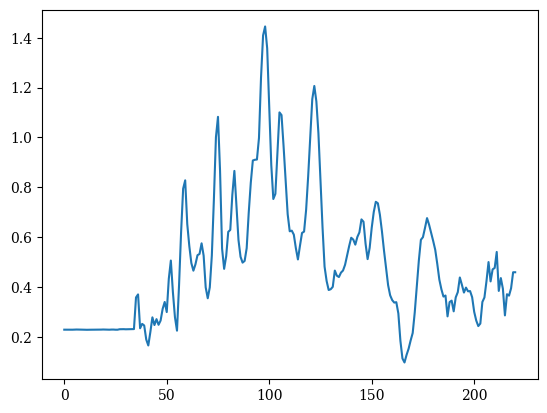

40.40201005025125


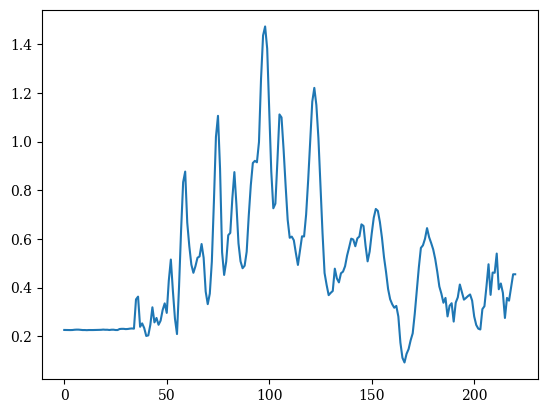

40.929648241206024


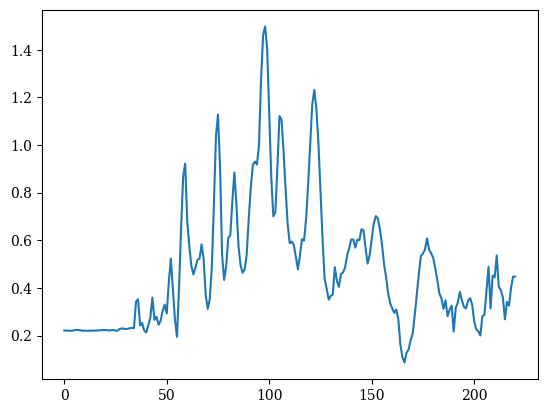

41.4572864321608


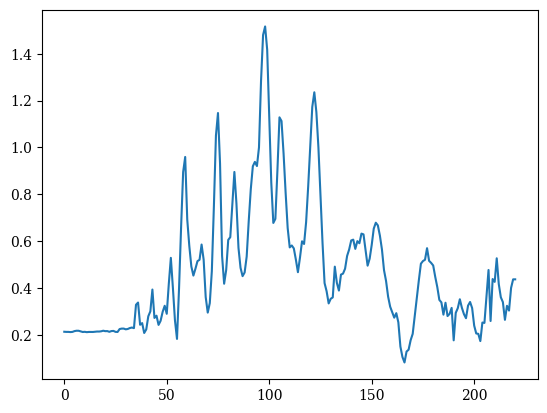

41.984924623115575


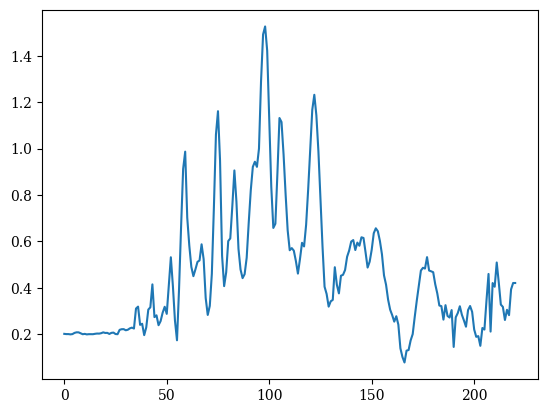

42.51256281407035


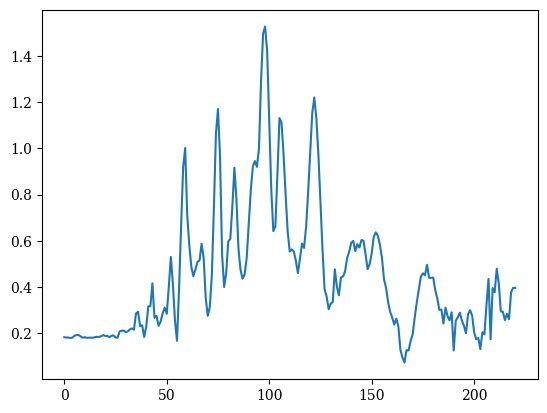

43.04020100502512


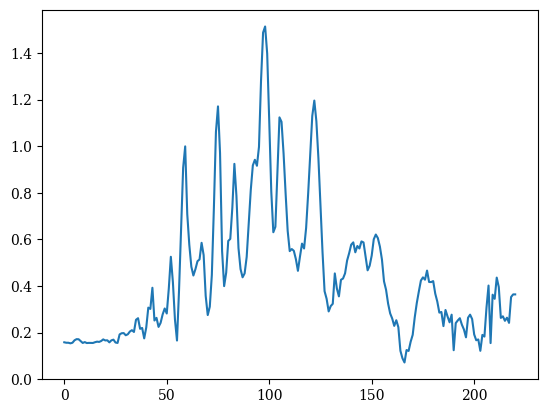

43.56783919597989


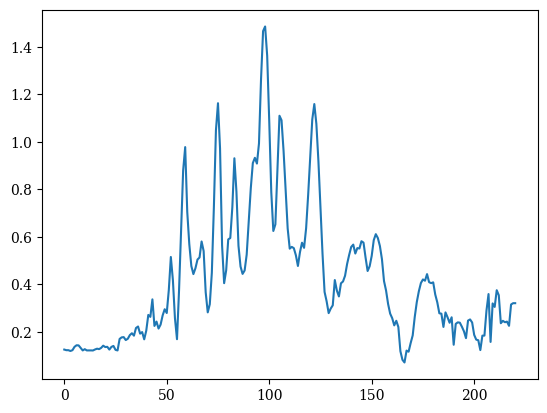

44.09547738693467


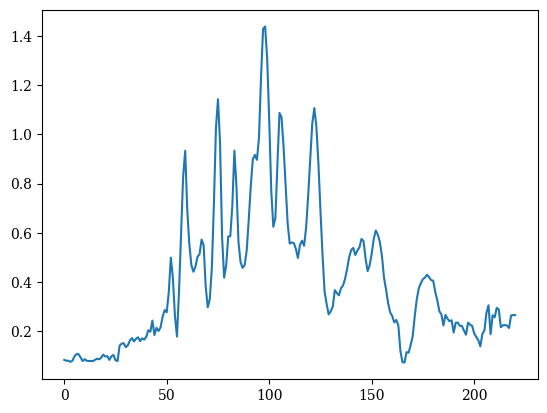

44.62311557788944


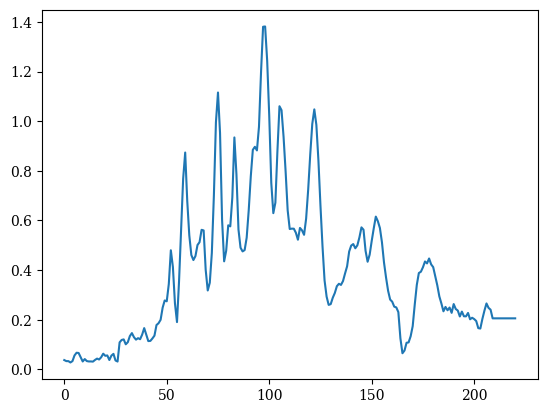

45.15075376884422


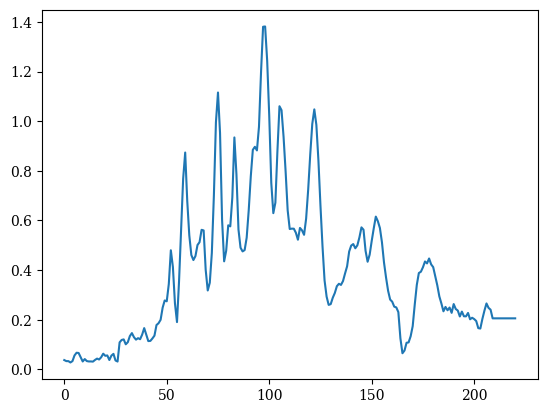

45.67839195979899


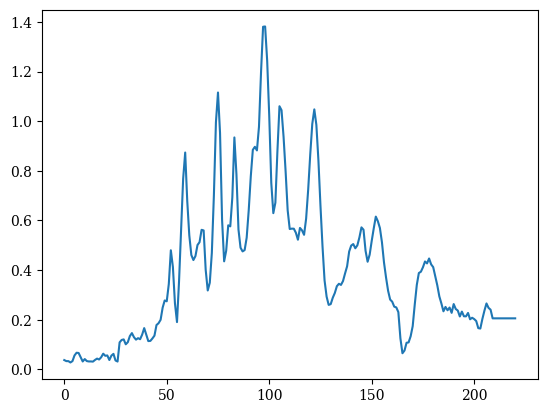

46.20603015075376


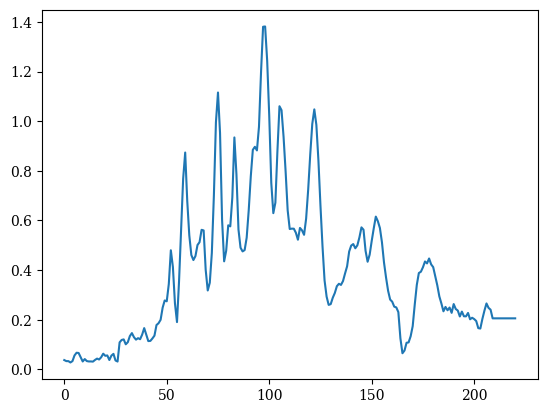

46.73366834170854


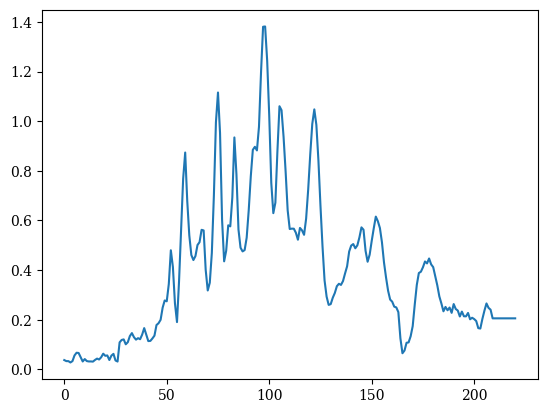

47.26130653266331


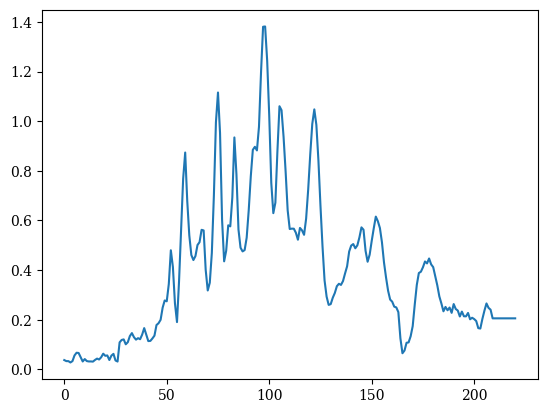

47.78894472361809


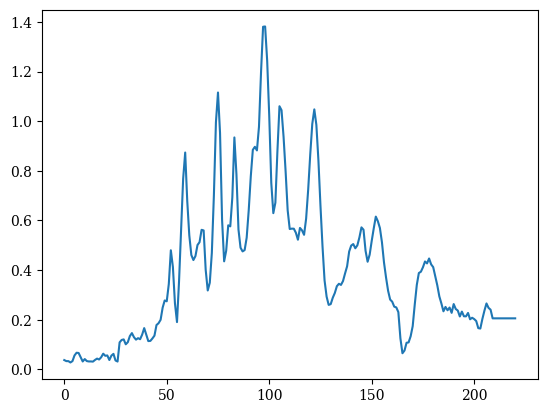

48.31658291457286


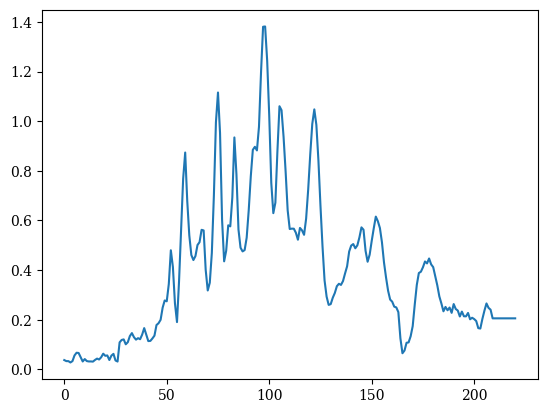

48.84422110552763


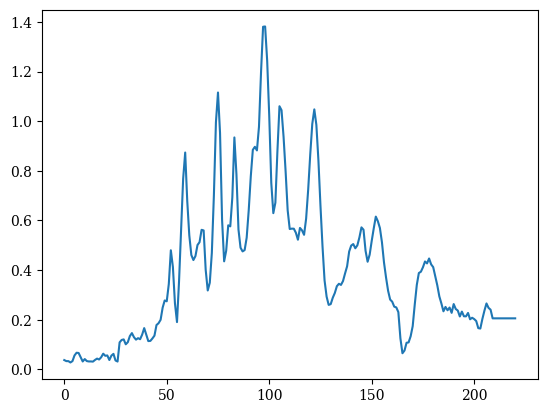

49.37185929648241


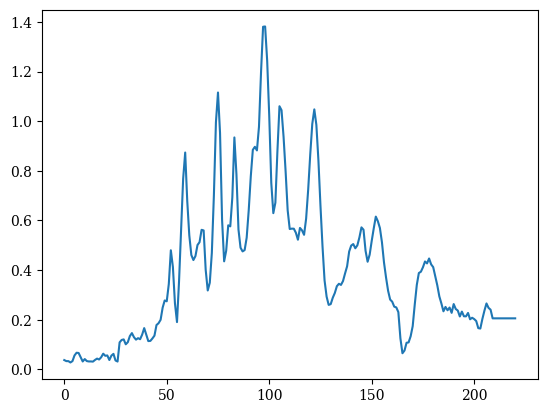

49.89949748743717


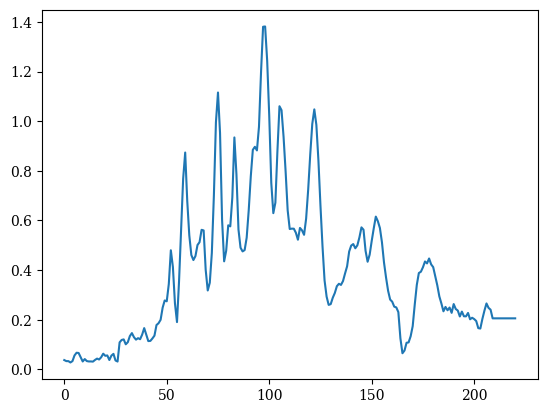

50.42713567839195


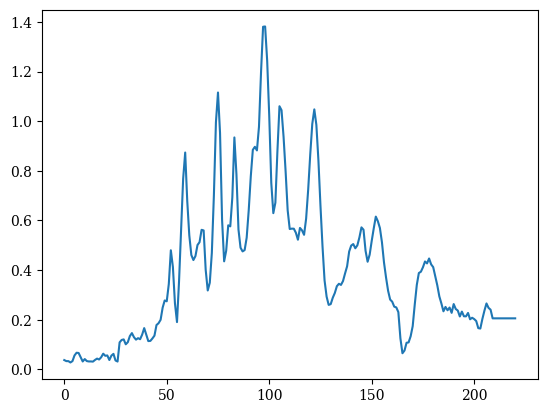

50.954773869346724


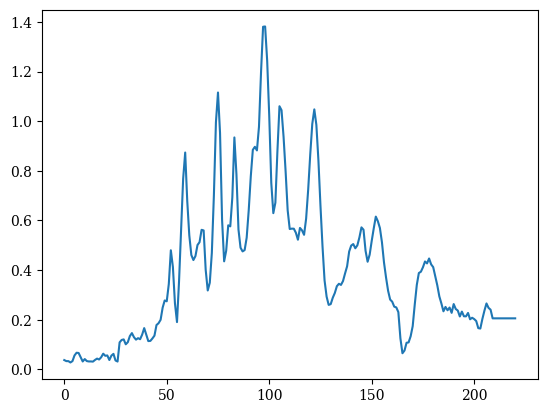

51.4824120603015


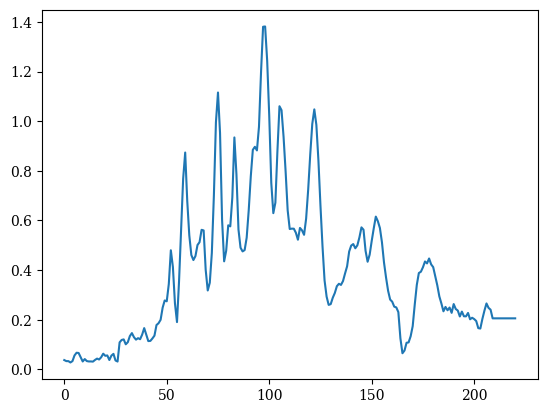

52.010050251256274


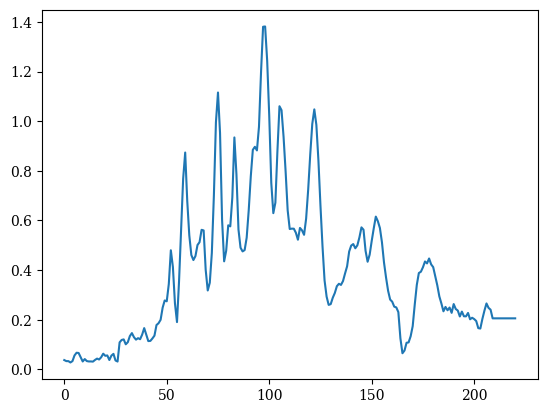

52.53768844221105


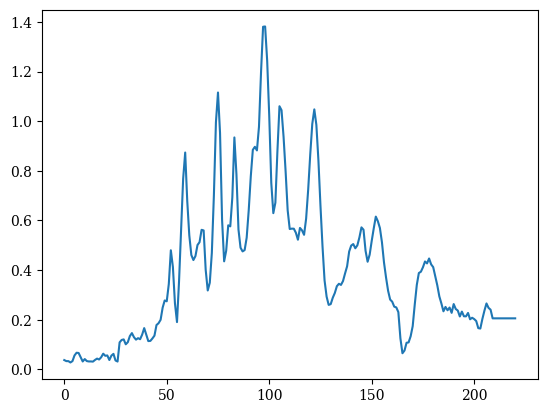

53.065326633165824


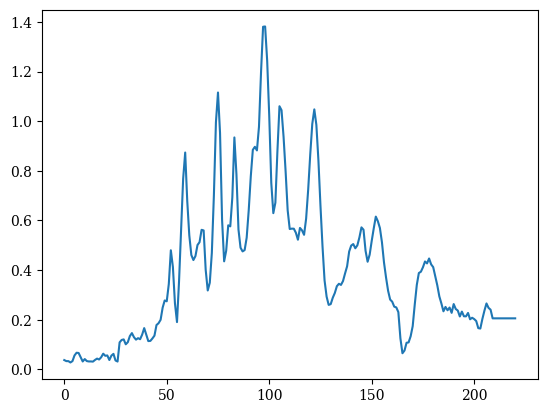

53.5929648241206


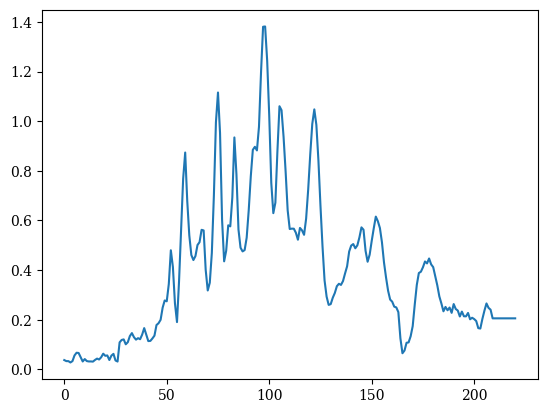

54.120603015075375


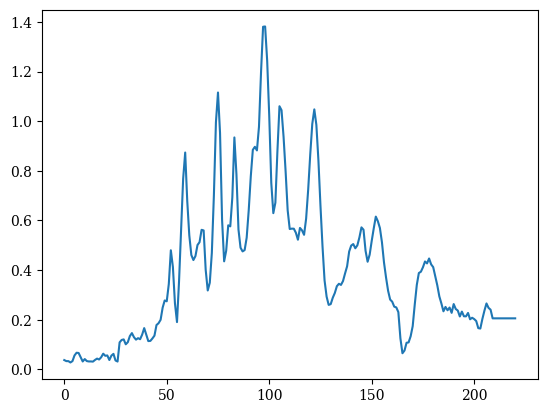

54.64824120603015


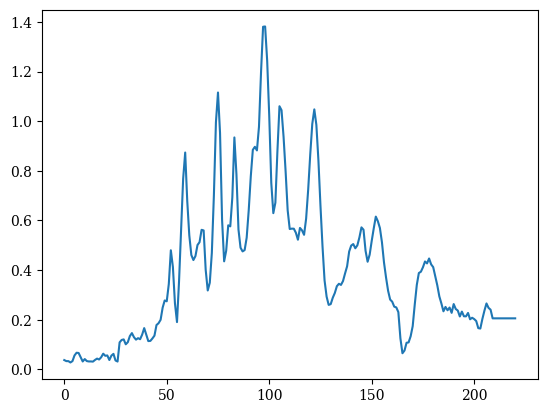

55.175879396984925


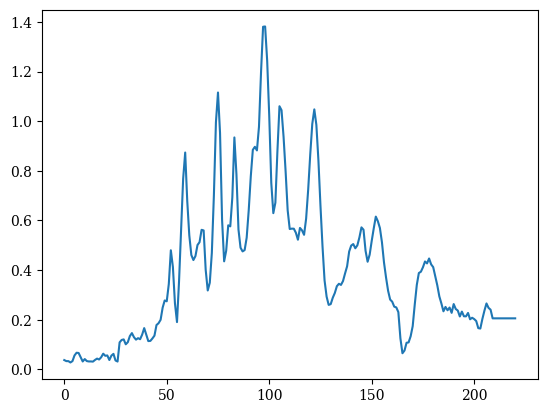

55.703517587939686


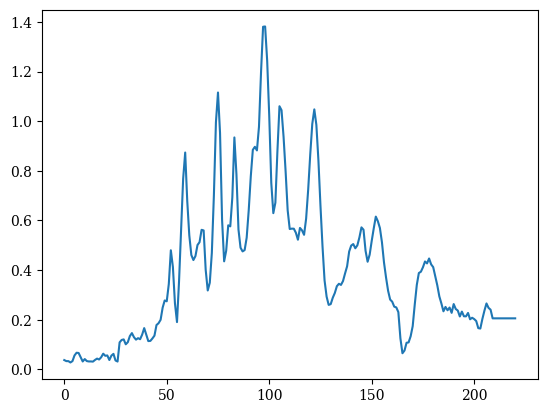

56.23115577889446


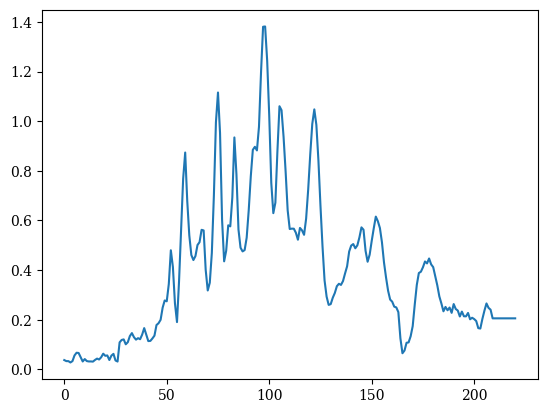

56.758793969849236


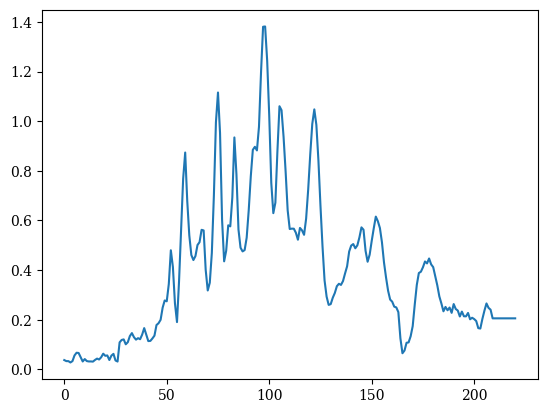

57.28643216080401


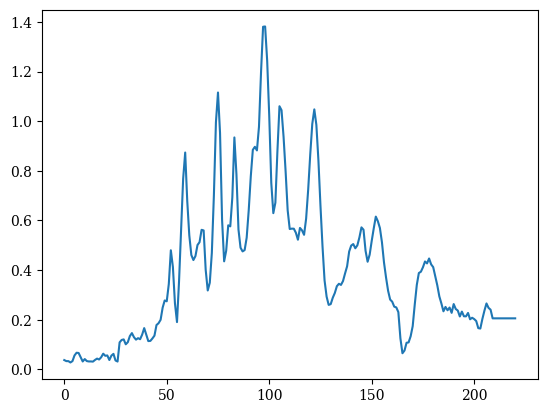

57.81407035175879


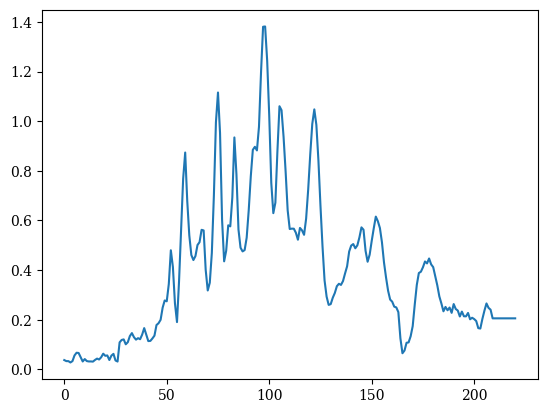

58.34170854271356


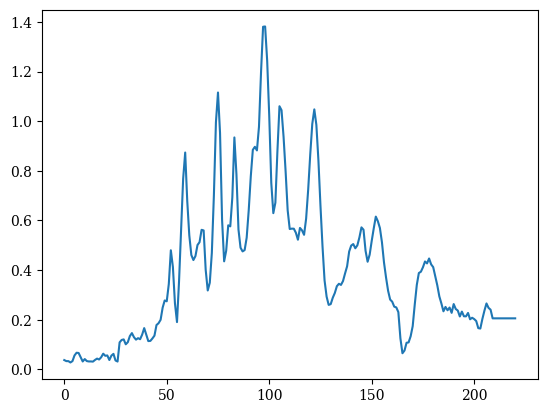

58.86934673366834


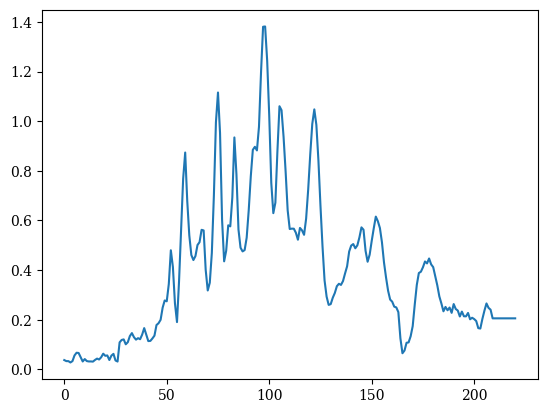

59.39698492462311


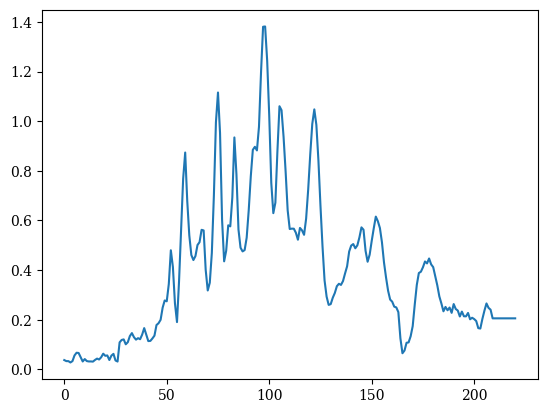

59.92462311557789


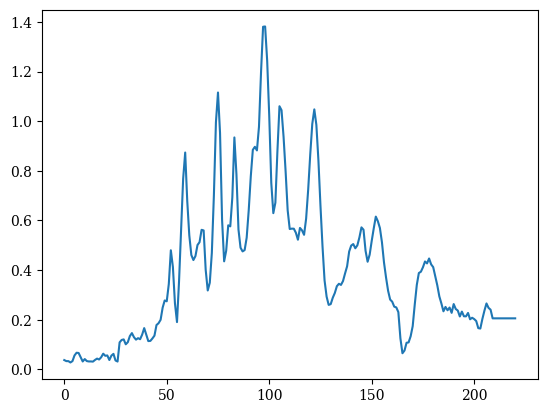

60.45226130653266


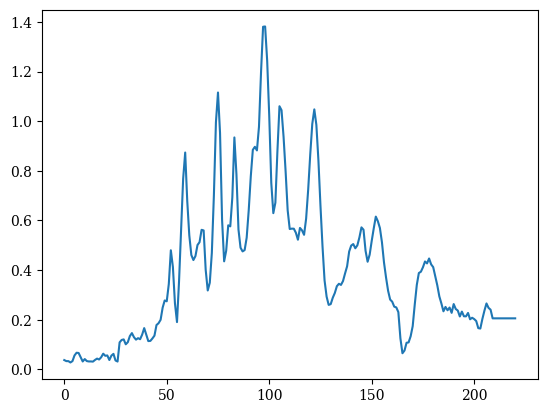

60.97989949748742


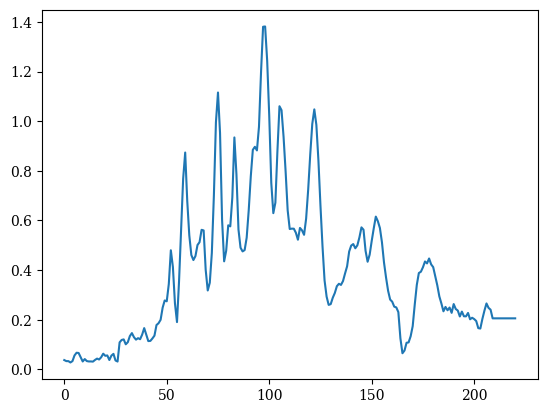

61.5075376884422


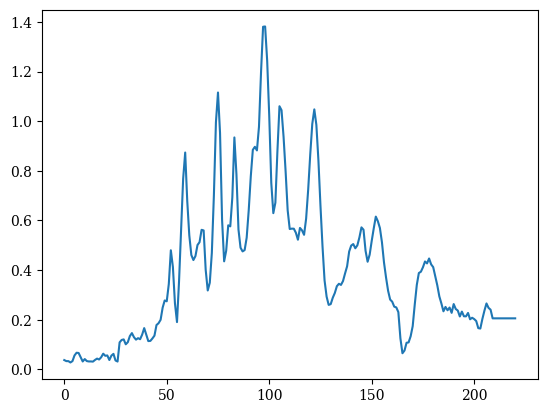

62.035175879396974


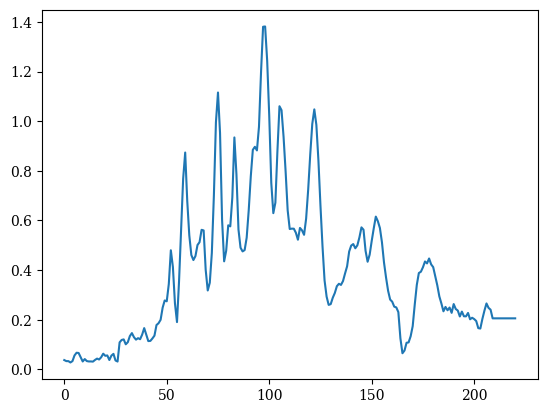

62.56281407035175


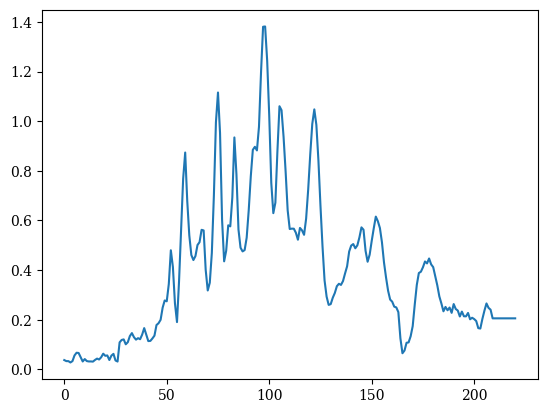

63.090452261306524


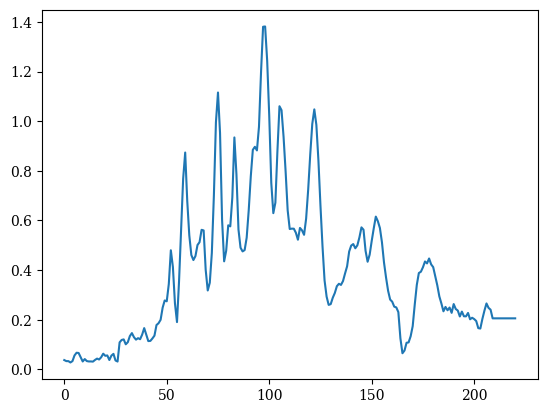

63.6180904522613


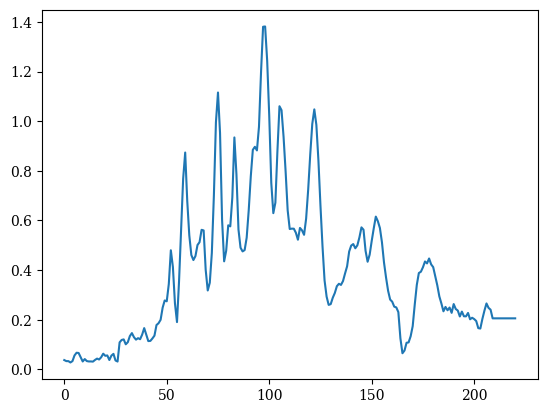

64.14572864321607


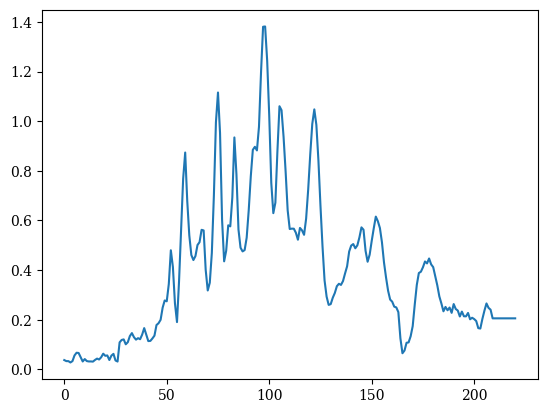

64.67336683417085


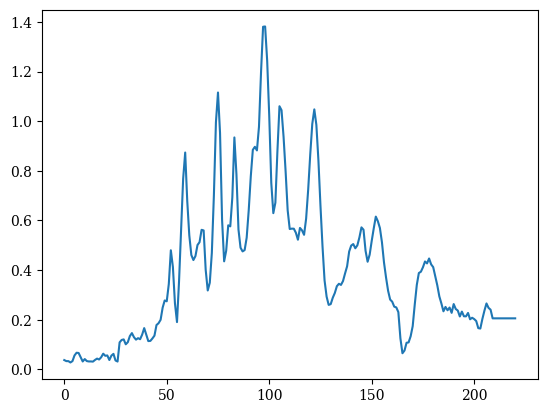

65.20100502512562


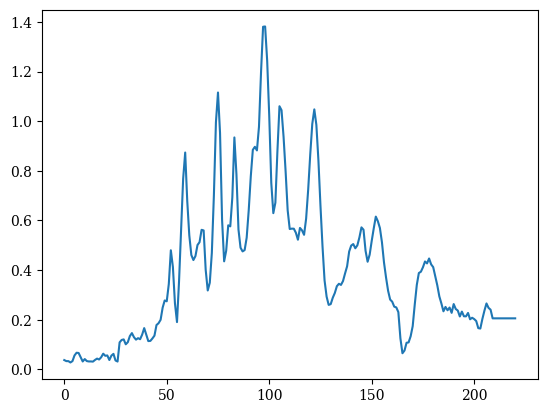

65.7286432160804


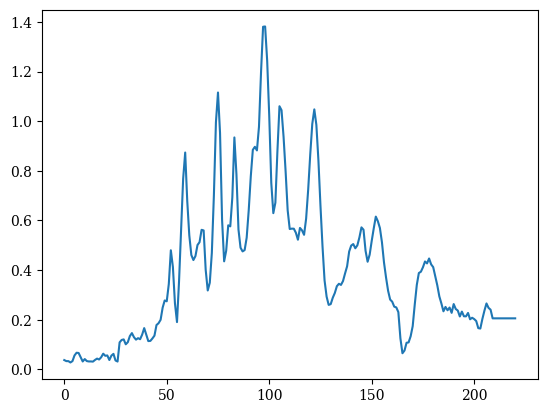

66.25628140703517


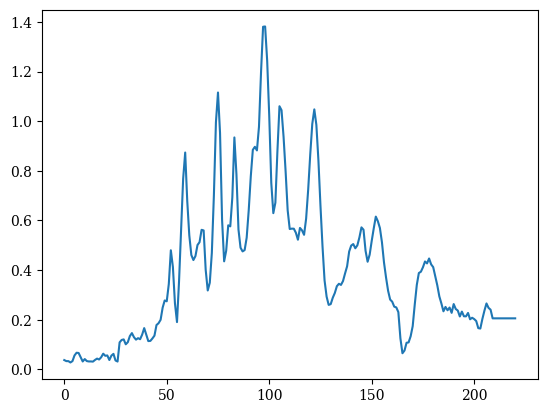

66.78391959798994


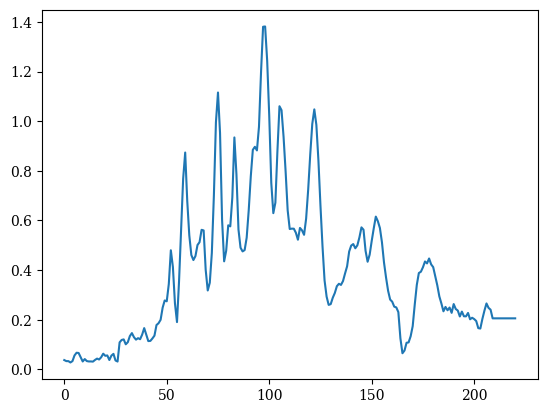

67.31155778894471


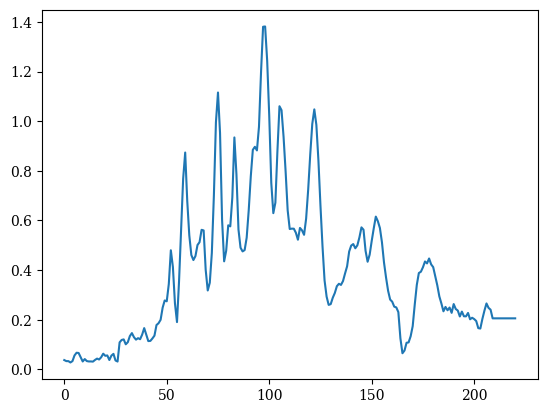

67.83919597989949


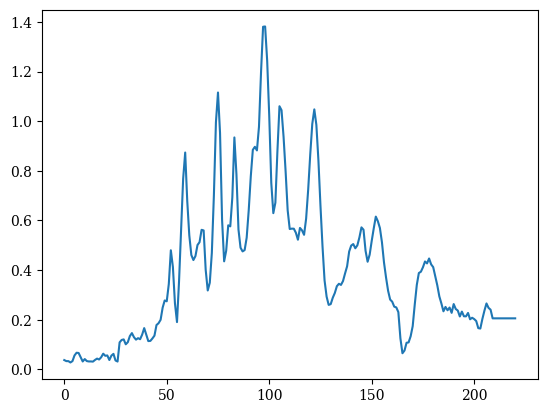

68.36683417085426


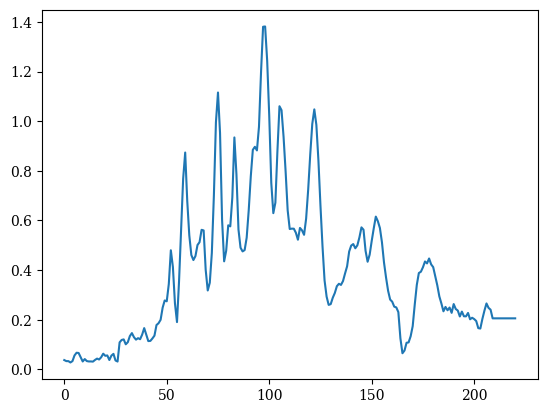

68.89447236180904


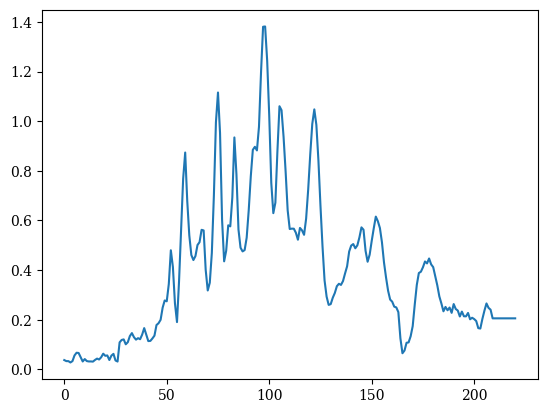

69.42211055276381


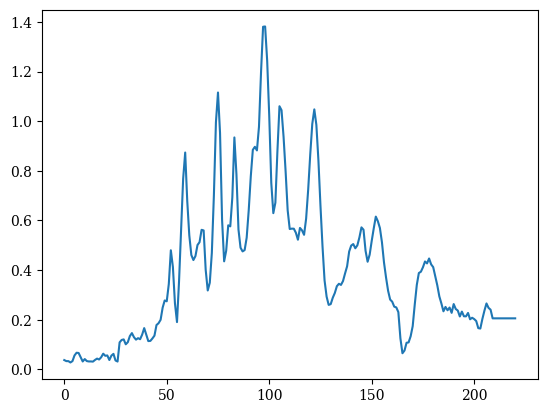

69.94974874371859


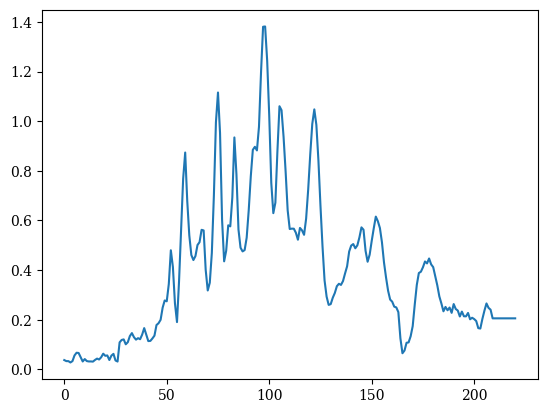

70.47738693467336


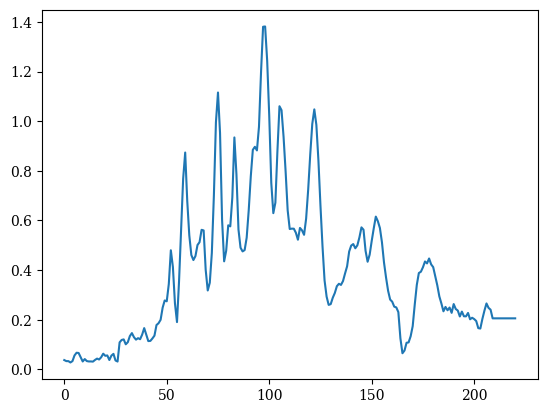

71.00502512562814


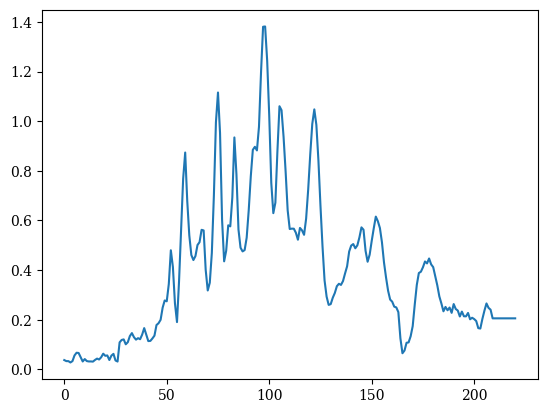

71.53266331658291


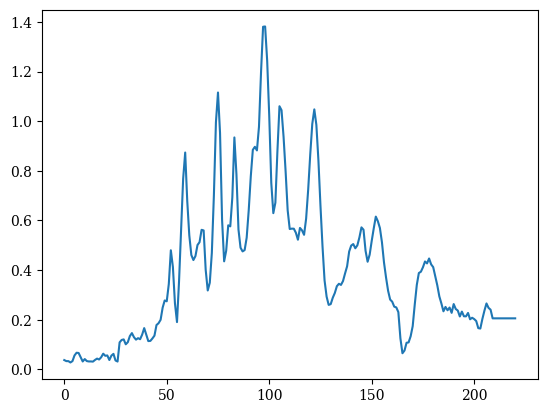

72.06030150753769


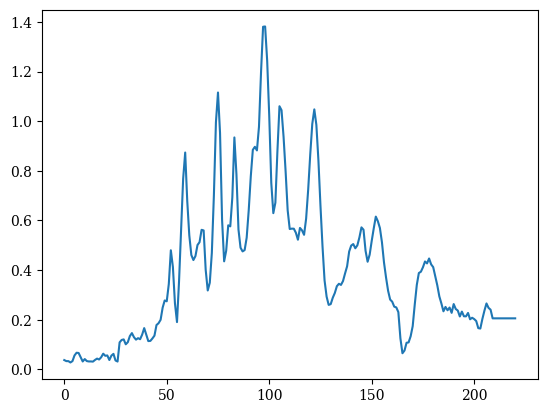

72.58793969849245


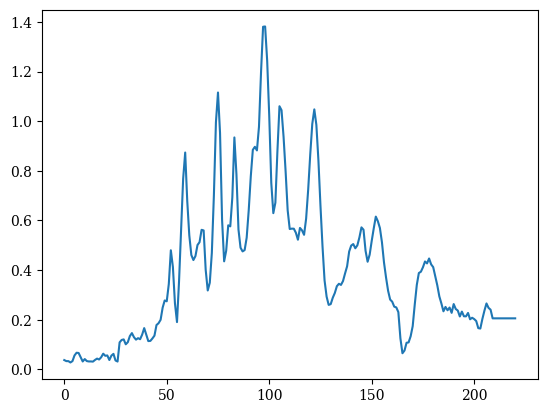

73.11557788944722


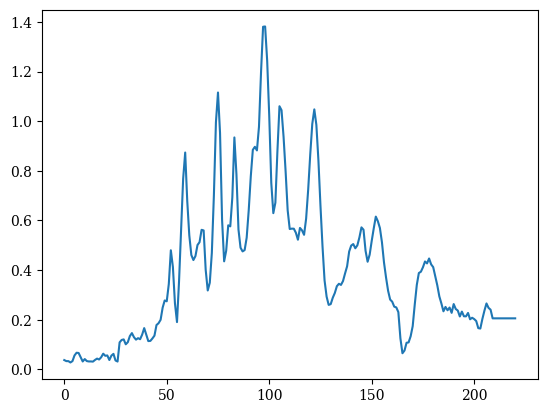

73.643216080402


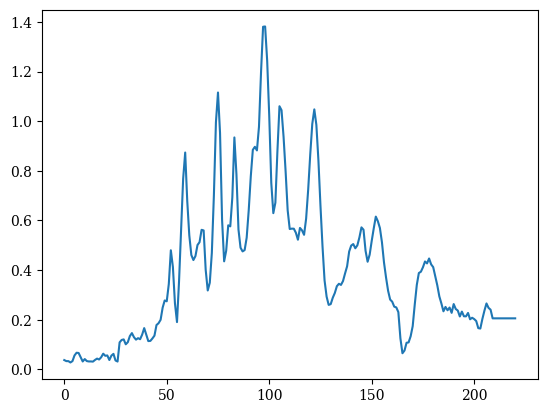

74.17085427135677


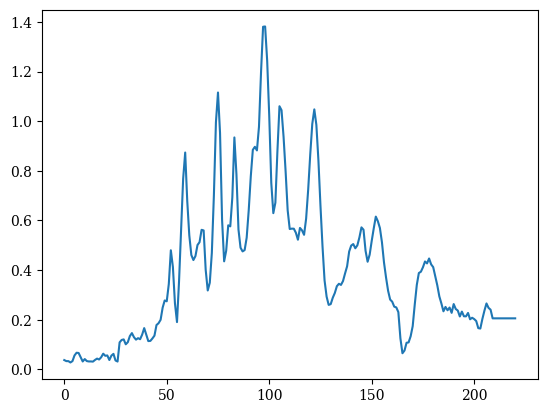

74.69849246231155


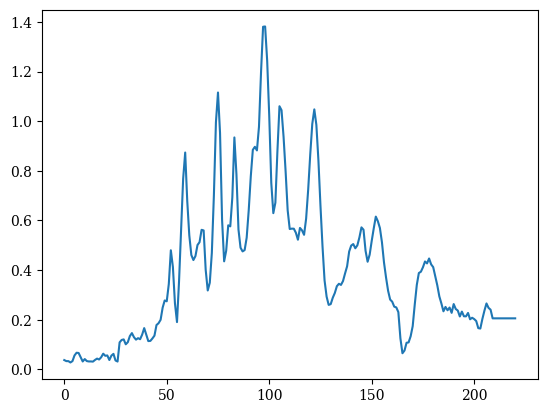

75.22613065326632


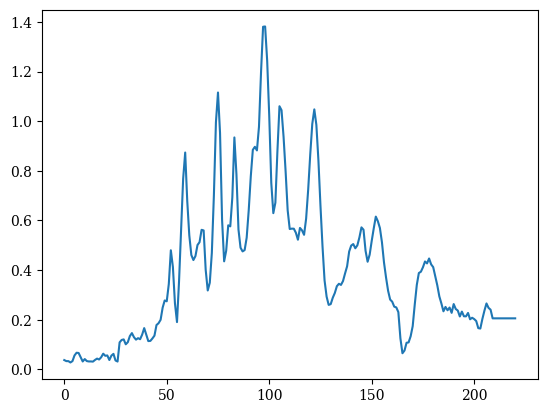

75.7537688442211


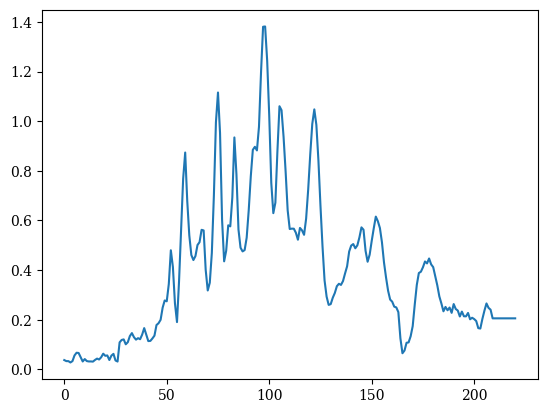

76.28140703517587


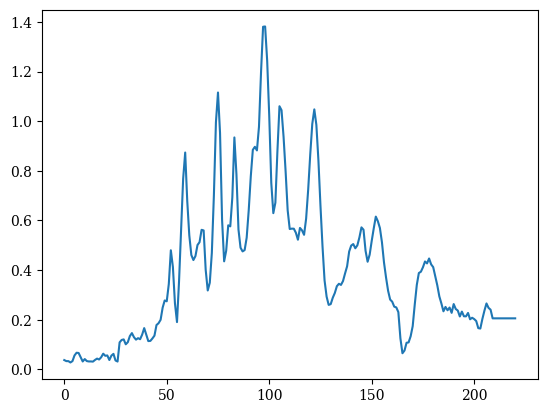

76.80904522613065


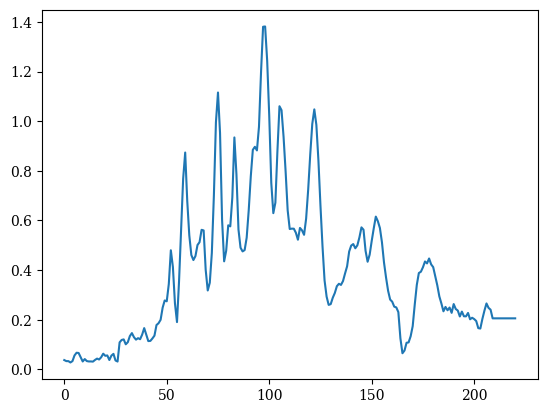

77.33668341708542


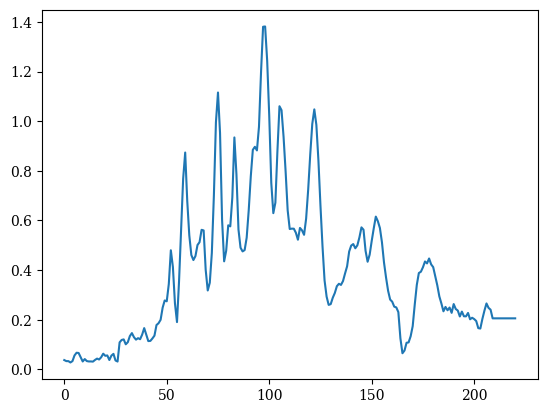

77.8643216080402


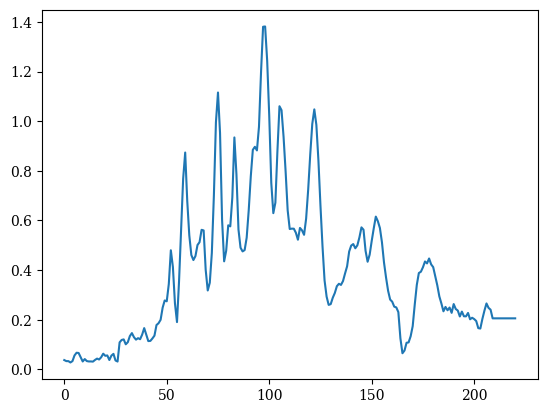

78.39195979899496


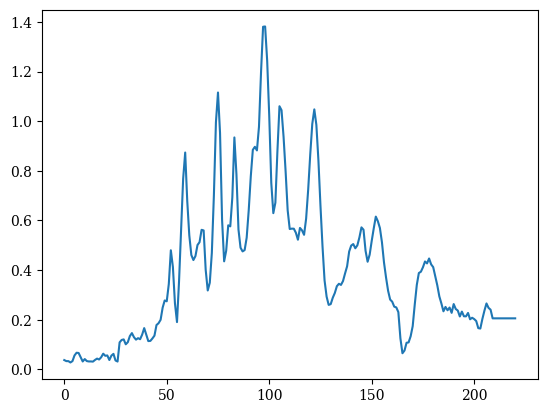

78.91959798994974


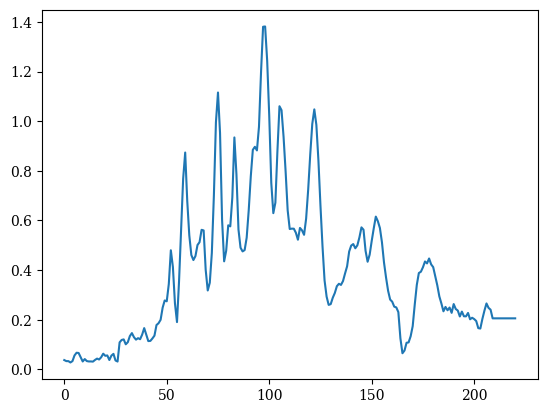

79.44723618090451


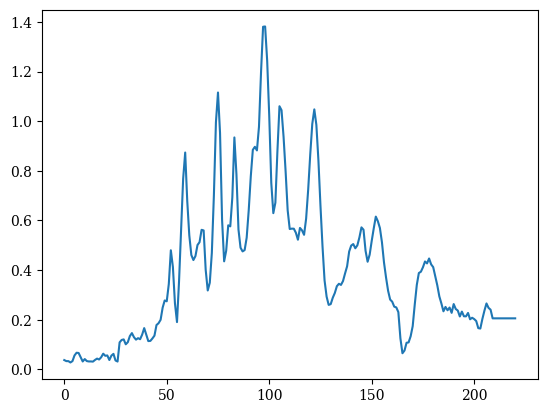

79.97487437185929


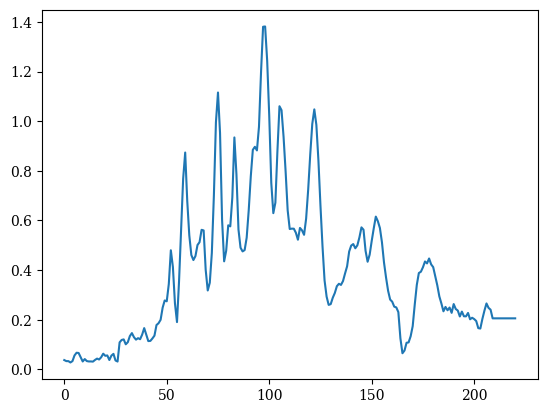

80.50251256281406


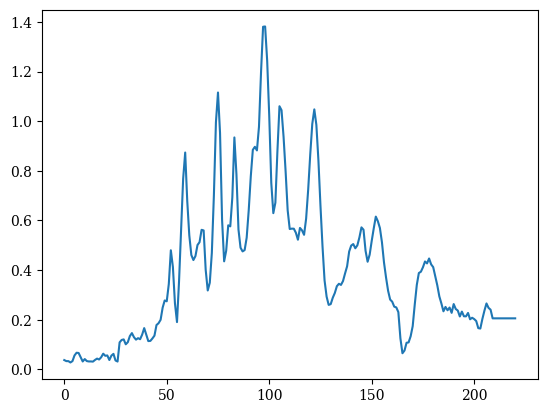

81.03015075376884


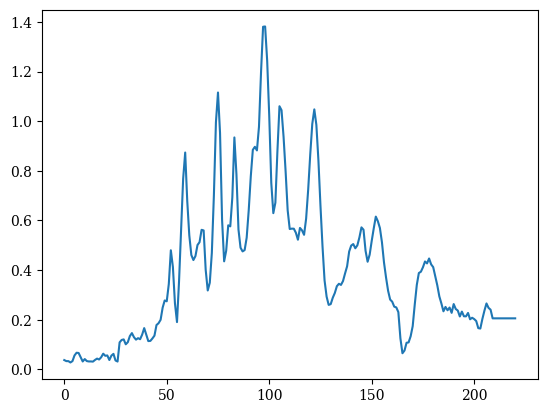

81.55778894472361


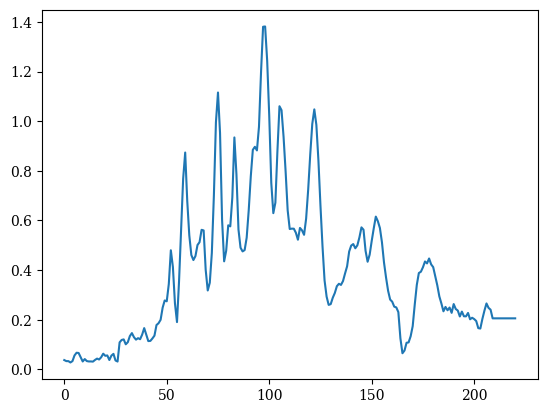

82.08542713567839


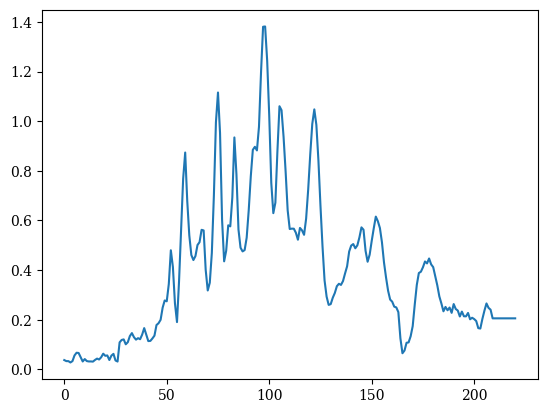

82.61306532663316


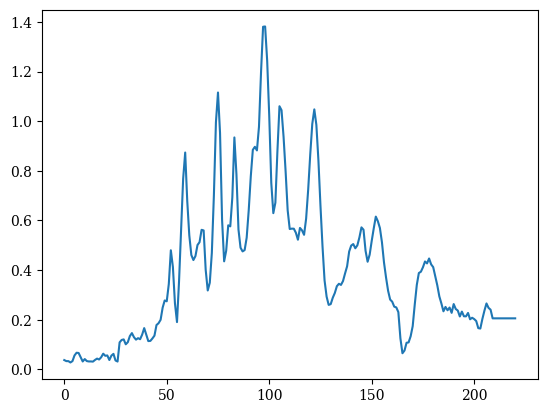

83.14070351758794


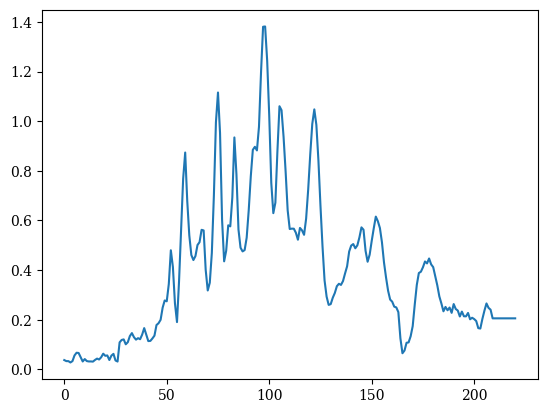

83.6683417085427


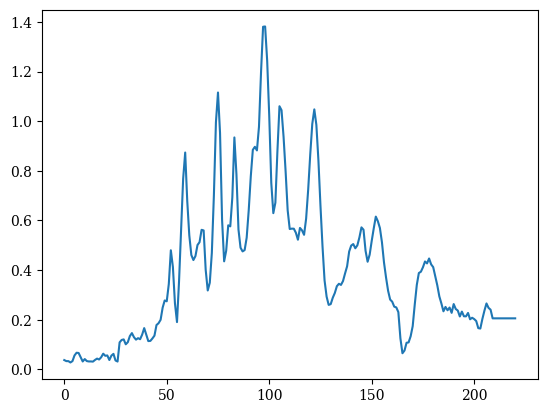

84.19597989949747


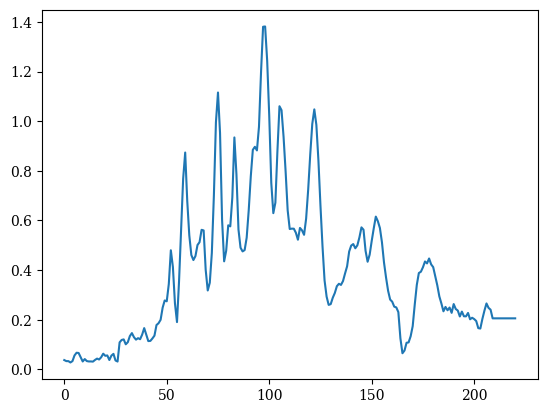

84.72361809045225


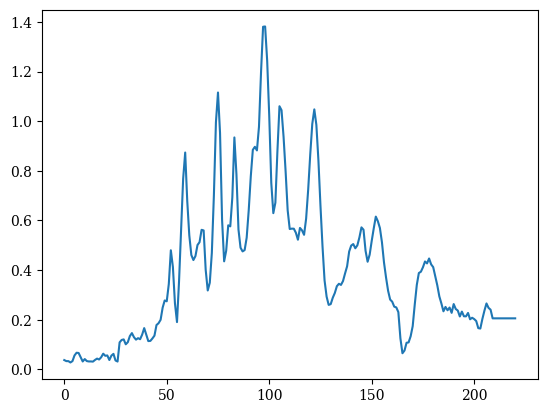

85.25125628140702


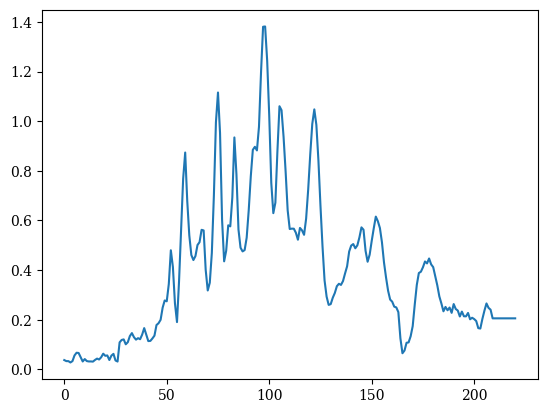

85.7788944723618


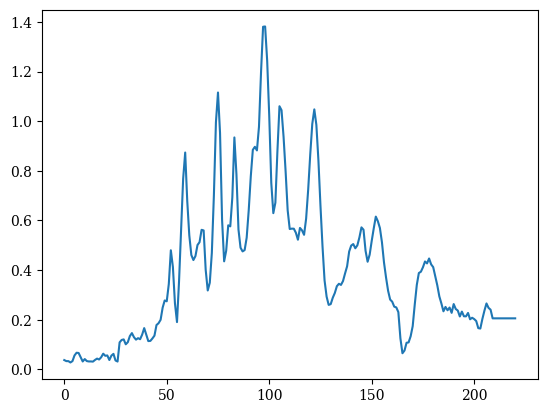

86.30653266331657


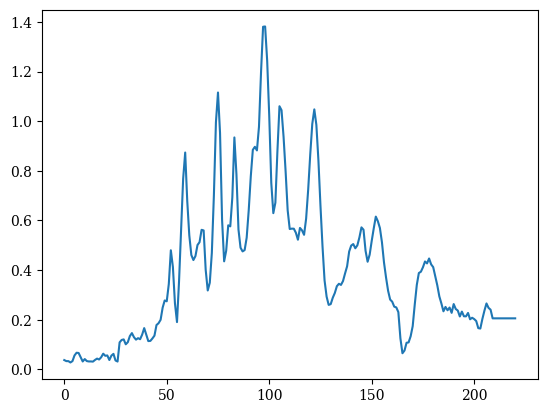

86.83417085427135


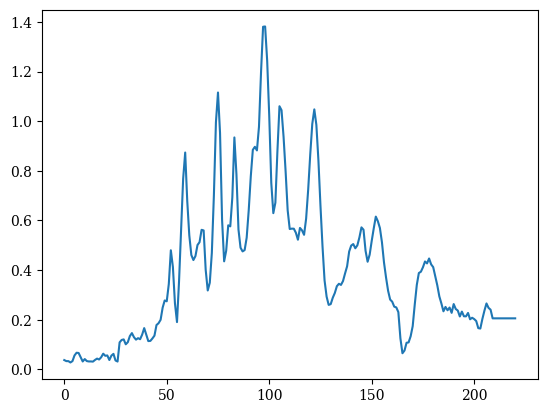

87.36180904522612


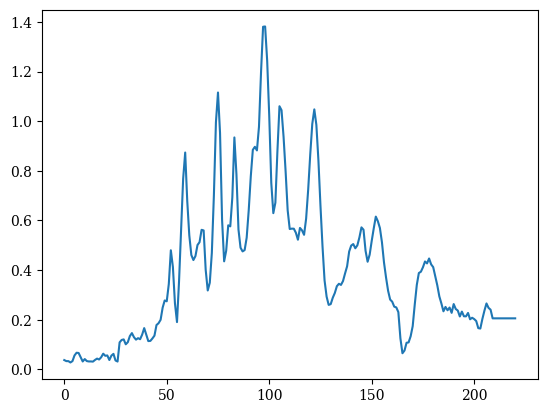

87.8894472361809


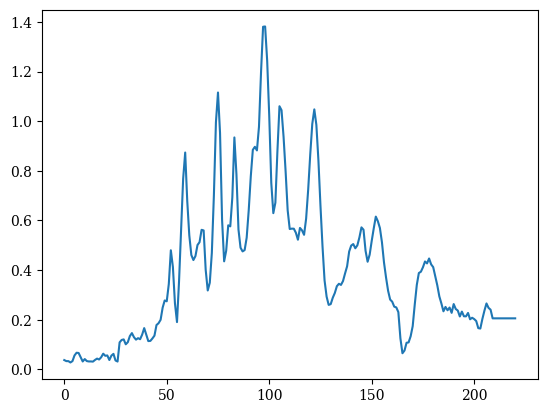

88.41708542713567


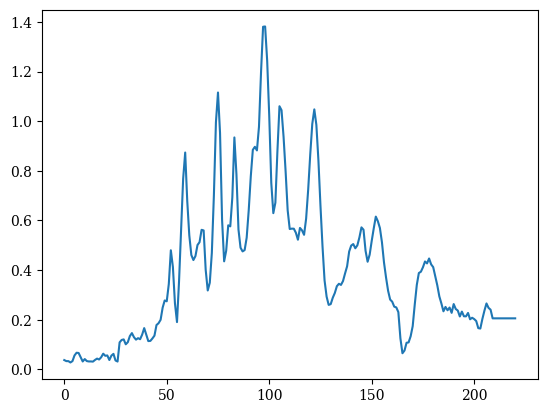

88.94472361809045


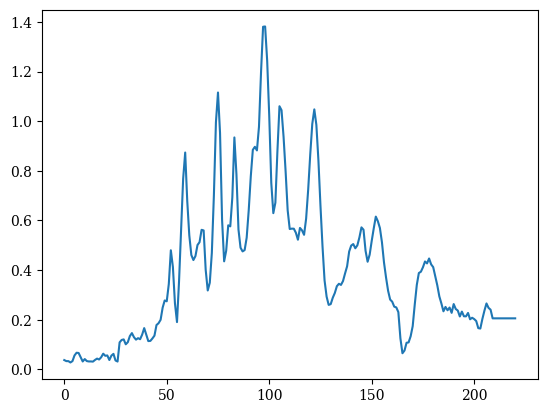

89.47236180904521


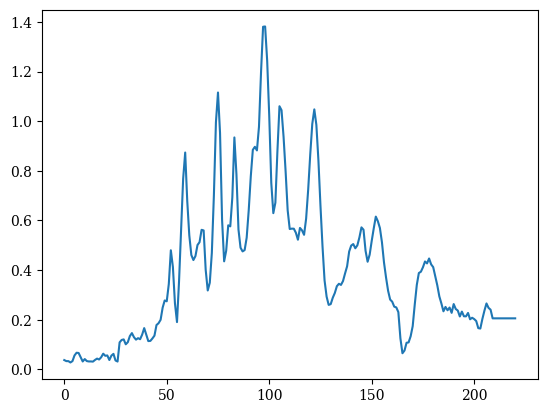

90.0


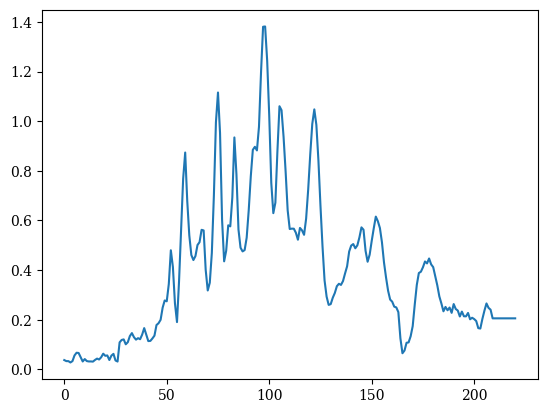

In [20]:
for i,z in enumerate(Z2):
    print (Y2[i][0])
    plt.plot(z)
    plt.show()

In [21]:
spec_arr = spec2d(specnew)
print (spec_arr)
print (np.shape(spec_arr))

221 21
[[-1.04607557e+01  1.61900000e+03  1.92159953e+00  5.95667957e+00]
 [-1.04607557e+01  1.65900000e+03  1.92159953e+00  5.95667957e+00]
 [-1.04607557e+01  1.69900000e+03  1.92159953e+00  5.95667957e+00]
 ...
 [ 4.45565041e+01  1.03390000e+04  2.05383010e-01  1.52047473e+01]
 [ 4.45565041e+01  1.03790000e+04  2.05383010e-01  1.52047473e+01]
 [ 4.45565041e+01  1.04190000e+04  2.05383010e-01  1.52047473e+01]]
(4641, 4)


10.0 400.0
('kernel:k1:log_constant', 'kernel:k2:metric:log_M_0_0', 'kernel:k2:metric:log_M_1_1')
[1.62356019 2.30258509 5.99146455]
Initial ln-likelihood: -9255.76
      fun: 3352.706958799518
 hess_inv: array([[1.62535833e-03, 1.79771613e-04, 2.42071616e-04],
       [1.79771613e-04, 3.73007094e-04, 2.41816080e-05],
       [2.42071616e-04, 2.41816080e-05, 1.64829014e-04]])
      jac: array([ 9.71738530e-08,  6.42998421e-06, -1.08286411e-05])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 194
      nit: 19
     njev: 174
   status: 2
  success: False
        x: array([0.64517229, 1.99749323, 8.93506693])
Final ln-likelihood: -3352.71


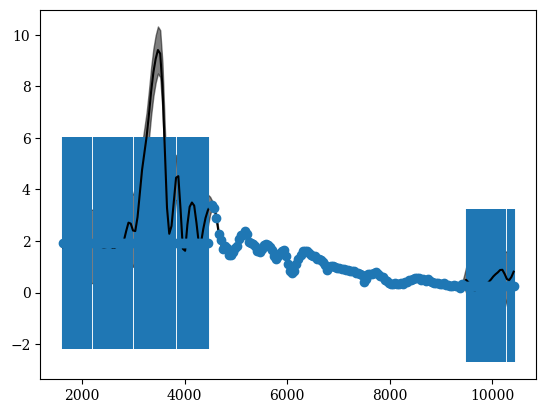

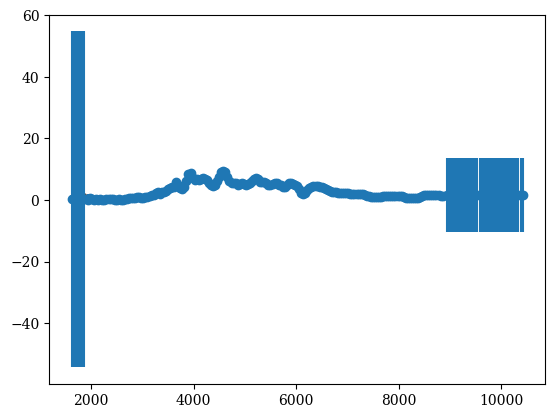

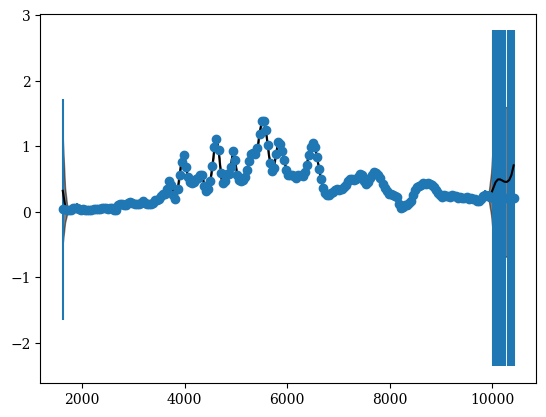

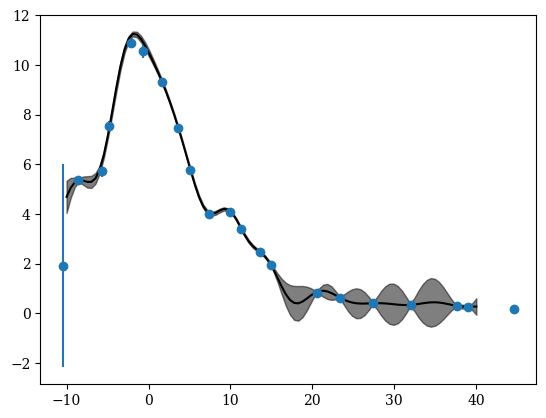

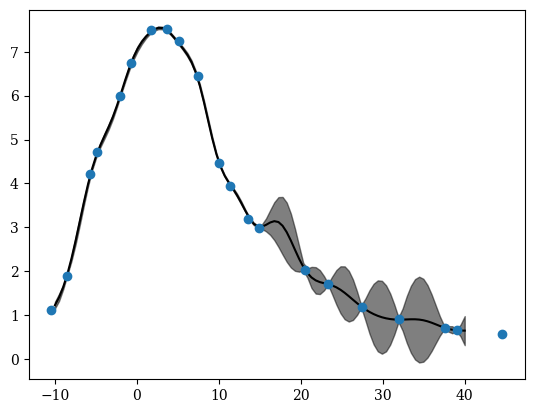

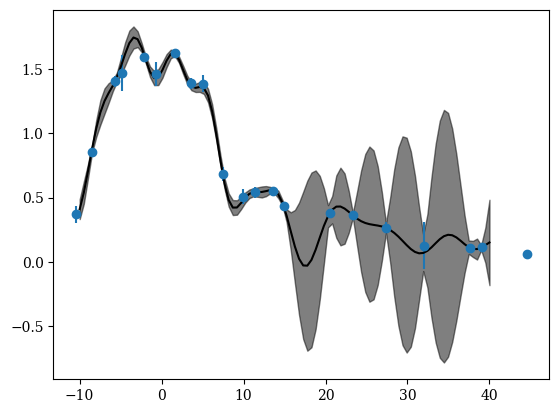

In [22]:
gp, x, y = gp2d.fit_gp_george_2d(spec_arr, phases, waves, printlog=True,plot=True)

In [23]:
phasearr = np.linspace(-10,60,200)
# wavearr = np.linspace(4000,7000,200)
wavearr = np.linspace(waves[0],waves[-1],200)
xv,yv = np.array(np.meshgrid(phasearr,wavearr))
xa = np.stack((xv.ravel(),yv.ravel()),axis=1)
pred_f, pred_var_f = gp.predict(y, xa, return_var=True)

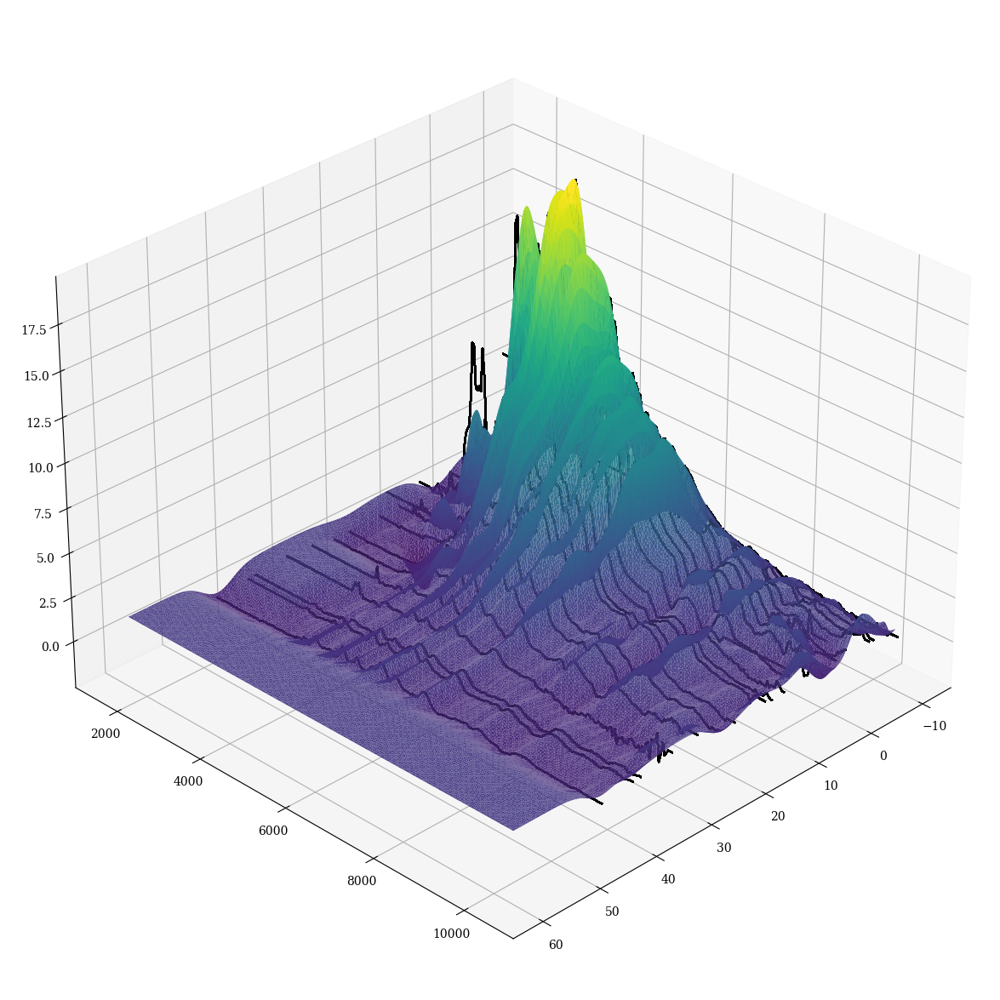

In [24]:
fig = plt.figure(figsize=(20,15))
# ax = fig.gca(projection='3d')
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(xv.ravel(), yv.ravel(), pred_f,cmap='viridis') 
xphase = x[:,0]
xwave = x[:,1]
for p in xphase:
    idx = np.array(xphase==p)
    idx_zero = np.array(y[idx]!=0)
    p_plot = xphase[idx][idx_zero]
    wave_plot = xwave[idx][idx_zero]
    y_plot = y[idx][idx_zero]
    ax.plot3D(p_plot, wave_plot, y_plot,color = 'k', alpha=.1)
ax.view_init(30, 45)
plt.show()

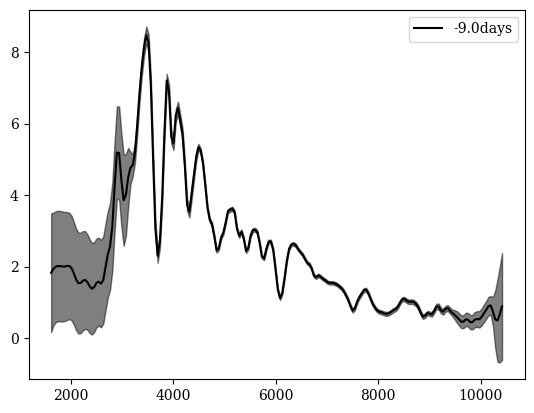

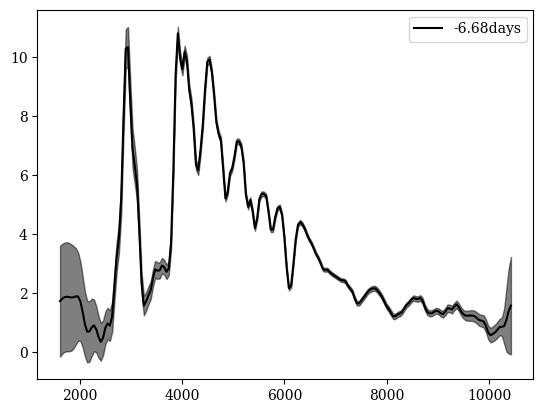

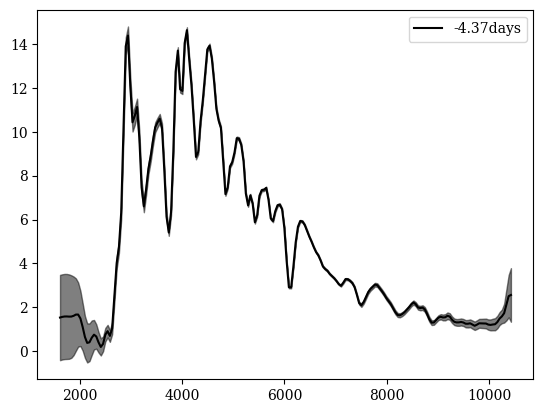

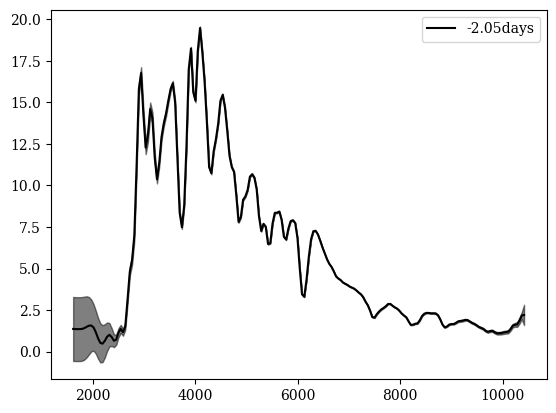

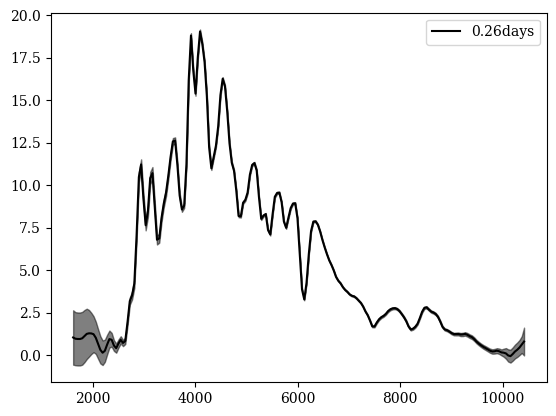

...

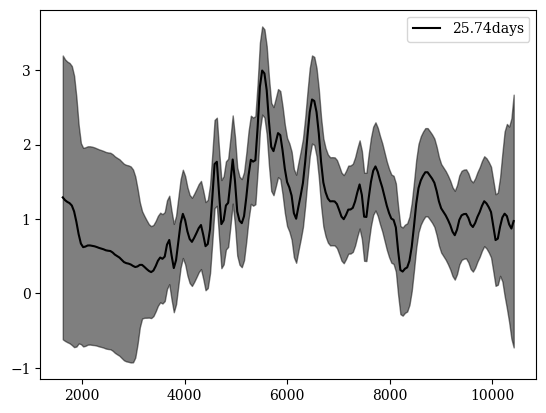

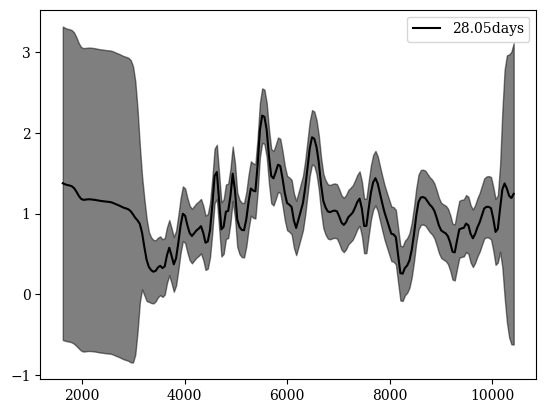

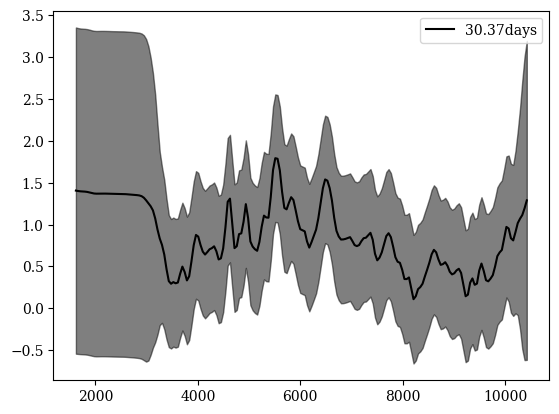

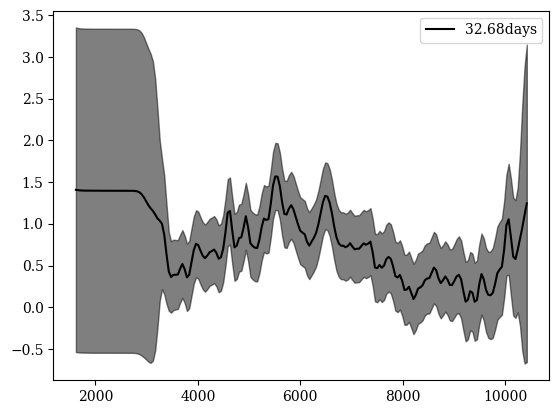

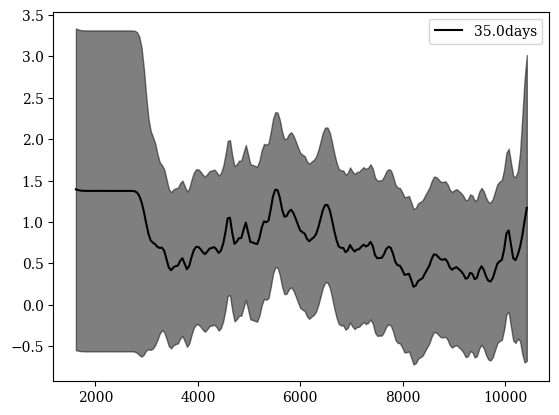

In [25]:
pind = int(len(phases)/2.)
phasearr = np.linspace(-9, 35, 20)
for p in phasearr:
#     wave = np.linspace(4000,7000,200)
    wave = np.linspace(waves[0],waves[-1],200)
    xa = np.vstack([[p]*200,wave]).T
#         print(xa)
    pred_f, pred_var_f = gp.predict(y, xa, return_var=True)
    xphase = x[:,0]
    idx = np.array(xphase==p)
    plt.plot(wave,pred_f,color='k', label = str(np.round(p,2)) + 'days')
    plt.fill_between(wave,pred_f-np.sqrt(pred_var_f),pred_f+np.sqrt(pred_var_f),alpha=0.5,color='k')
    plt.legend()
    plt.show()